In [ ]:
# for your info:

# the location of data on cluster:
# scripts/ data/ nim_fmri_nemo__/ sub_0001/ net_series_t0_1.txt >>> run1 with threshold of 0



# 1:21 latchers

# remained people are explorers

# Packages loading

In [10]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression

import pylab
import random


# !pip install networkx
import numpy as np
import networkx as nx

import matplotlib.pyplot as plt

import seaborn as sns


# Data uploading

In [1]:
# from google.colab import drive
# # drive.mount('/content/drive')
# drive.mount("/content/drive", force_remount=True)



#FOR COLAB:
import pandas as pd
import numpy as np
import scipy.io as sio
from google.colab import files


uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(  name=fn, length=len(uploaded[fn])))

Saving tmeanrun_1_networks_concat.csv to tmeanrun_1_networks_concat.csv
User uploaded file "tmeanrun_1_networks_concat.csv" with length 190510 bytes


In [11]:

df = pd.read_csv('tmeanrun_1_networks_concat.csv')#"t0_1_networks_concat.csv")  t0_4_networks_concat.csv
# df
DATA_LATCHERS = df[df['Type']=='Latchers']
DATA_LATCHERS = DATA_LATCHERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_LATCHERS
DATA_LATCHERS = DATA_LATCHERS.reset_index().drop(['index'],axis=1).copy()






DATA_EXPLORERS = df[df['Type']=='Explorers']
DATA_EXPLORERS = DATA_EXPLORERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_EXPLORERS
DATA_EXPLORERS = DATA_EXPLORERS.reset_index().drop(['index'],axis=1).copy()


# # df = pd.read_csv("Explorers_rest1.csv")

df = df.iloc[:, [1,2,3,4,5,6,7,8]]

df

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
5775,0,1,0,0,1,1,1,0
5776,1,1,0,0,1,1,0,0
5777,1,0,1,1,1,0,1,1
5778,0,0,1,1,1,0,0,1


In [51]:

pd.read_csv('tmeanrun_1_networks_concat.csv')

,Unnamed: 0,0,1,2,3,4,5,6,7,Subject,Type
0,0,1,1,0,1,1,0,1,0,1,Latchers
1,1,1,1,1,1,0,0,1,1,1,Latchers
2,2,1,1,0,0,0,0,1,0,1,Latchers
3,3,0,1,1,0,1,0,0,0,1,Latchers
4,4,1,1,1,1,0,0,0,1,1,Latchers
...,...,...,...,...,...,...,...,...,...,...,...
5775,5775,0,1,0,0,1,1,1,0,35,Explorers
5776,5776,1,1,0,0,1,1,0,0,35,Explorers
5777,5777,1,0,1,1,1,0,1,1,35,Explorers
5778,5778,0,0,1,1,1,0,0,1,35,Explorers


In [6]:
DATA_LATCHERS

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
3395,0,1,0,0,0,1,0,0
3396,1,1,0,0,0,0,0,0
3397,1,1,0,0,1,0,0,0
3398,0,0,0,0,1,0,0,0


In [5]:
DATA_EXPLORERS

,0,1,2,3,4,5,6,7
0,1,1,1,1,1,0,1,0
1,0,1,0,1,0,1,1,1
2,0,0,1,1,0,1,1,0
3,1,1,0,0,0,1,1,0
4,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...
2375,0,1,0,0,1,1,1,0
2376,1,1,0,0,1,1,0,0
2377,1,0,1,1,1,0,1,1
2378,0,0,1,1,1,0,0,1


In [50]:
# replicated data for latchers and explorers




DATA_LATCHERS = pd.concat([DATA_LATCHERS, DATA_LATCHERS], ignore_index=True)





DATA_EXPLORERS = pd.concat([DATA_EXPLORERS, DATA_EXPLORERS, DATA_EXPLORERS], ignore_index=True)


In [12]:
df

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
5775,0,1,0,0,1,1,1,0
5776,1,1,0,0,1,1,0,0
5777,1,0,1,1,1,0,1,1
5778,0,0,1,1,1,0,0,1


In [13]:
data_p = df.T
data_p

,0,1,2,3,4,5,6,7,8,9,...,5770,5771,5772,5773,5774,5775,5776,5777,5778,5779
0,1,1,1,0,1,1,1,1,0,0,...,0,1,0,0,1,0,1,1,0,1
1,1,1,1,1,1,1,1,1,0,0,...,1,1,1,1,1,1,1,0,0,0
2,0,1,0,1,1,1,1,1,0,0,...,1,1,0,0,0,0,0,1,1,0
3,1,1,0,0,1,0,1,1,0,0,...,1,0,0,1,1,0,0,1,1,0
4,1,0,0,1,0,1,0,0,0,0,...,1,1,0,1,1,1,1,1,1,0
5,0,0,0,0,0,0,0,1,1,0,...,0,1,0,1,1,1,1,0,0,0
6,1,1,1,0,0,0,0,1,0,0,...,0,0,1,1,1,1,0,1,0,0
7,0,1,0,0,1,1,1,1,0,0,...,0,0,0,0,1,0,0,1,1,0


In [14]:
data_p = np.array(data_p)
np.shape(data_p)
l_t = len(data_p.T)
ROI = 8
np.shape(data_p) #format of data must be ROI*t


(8, 5780)

In [15]:
data = data_p.T
data

array([[1, 1, 0, ..., 0, 1, 0],
       [1, 1, 1, ..., 0, 1, 1],
       [1, 1, 0, ..., 0, 1, 0],
       ...,
       [1, 0, 1, ..., 0, 1, 1],
       [0, 0, 1, ..., 0, 0, 1],
       [1, 0, 0, ..., 0, 0, 0]])

# H,J estimation

In [16]:



''' run this block, if you consider using function of ENERGY_vector_to_mat



def Hamiltonian(sigma_vec, h_vec, J_mat):



      first_term = np.dot(  h_vec , sigma_vec)

      # print('first term is' , first_term)


      second_term = 0

      N = len(sigma_vec)

      for i in range(N):
        for j in range(i+1, N):

          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])
          # print(i,j)

      second_term2 =   second_term


      energy = -(first_term + second_term2)
      # print(energy )

      return(energy)




sigma = [0,1]
V = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)

V




def ENERGY_vector_to_mat(V,h_vec, J_mat):
    H = []
    for i in range(0,2** len(h_vec)):

      H.append(Hamiltonian(list(V[i,:]), h_vec, J_mat))

    return(np.array(H))



In [77]:
'you can change the eps, alpha and beta inside the function.'

def HandJ(data_p, ROI, l_t):

  #parameters
  expected_value = np.zeros(ROI)
  correlation_value = np.zeros((ROI,ROI))
  for i in range(ROI):
    expected_value[i] = np.sum(data_p[i])/l_t #mean for a specific ROI over time, also it is y data
    for j in range(ROI):
      correlation_value[i][j] = np.dot(data_p[i], data_p[j])/l_t


  print('correlation_value is ', correlation_value)


  eps = 0.000001  # 0.000001 # 0.00000001
  e = 1e-8 #1e-8, 1e-10

  #learning rate
  alpha = 0.1
  beta = alpha

  #initial data
  H_rand = np.array([1,1,1,1,1,1,1,1]) *0.1
  J_rand = np.ones((ROI,ROI)) *0.1
  np.fill_diagonal(J_rand, 0)

  #all possible pattern
  sigma = [0,1]
  V = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)





  from scipy.special import softmax


  E_rand =  -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))     # ENERGY_vector_to_mat(V,H_rand, J_rand)            #-1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))


  print(E_rand.shape)





  P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand))

  model_expected = np.dot(V.T,P_rand)
  model_corrolation = np.dot(P_rand * V.T, V)
  i = 0
  H_rand_old = np.copy(H_rand)

  #initial condition for starting the while loop.
  cond6 = 100
  cond7 = 100


  jj = 0

  while cond6 > eps and  cond7 > eps:


    jj+=1

    H_rand_old = np.copy(H_rand)
    J_rand_old = np.copy(J_rand)

    H_rand +=  alpha * np.log((expected_value / (model_expected + e))) #alpha * (expected_value - model_expected) #alpha * np.log((expected_value / (model_expected + e)))
    J_rand +=  beta * np.log((correlation_value / (model_corrolation + e)))     #beta * (correlation_value -  model_corrolation)  #beta * np.log((correlation_value / (model_corrolation + e)))



    np.fill_diagonal(J_rand, 0)



    E_rand =  -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))         #ENERGY_vector_to_mat(V,H_rand, J_rand)           #-1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))




    P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand) )
    model_expected = np.dot(V.T,P_rand)
    model_corrolation = np.dot(P_rand * V.T, V)

    # cond4 = np.sum(abs(alpha  * np.log(((model_expected+e)/(expected_value)))))/8
    cond6 = np.sum(abs((H_rand-H_rand_old)))/8
    cond7 = np.sum(abs(J_rand-J_rand_old))/64



    if jj%1000 == 0 :

      print('cond 6, 7 and eps are: ',  cond6, cond7 ,eps)


  return H_rand, J_rand

In [119]:
data_p.shape

(8, 5780)

In [79]:



H_rand, J_rand = HandJ(np.array(data_p), ROI, l_t)



H_latcher, J_latcher = HandJ(np.array(DATA_LATCHERS.T), ROI, l_t_LATCHER)


H_explorers, J_explorers = HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t_EXPLORER)




h_vec, J_mat = H_rand, J_rand #HandJ(data_p, ROI, l_t)[0] # np.array([0,1,0]) ##### call fatemeh's function


correlation_value is  [[0.5017301  0.24740484 0.26314879 0.2517301  0.26055363 0.29134948
  0.27145329 0.2517301 ]
 [0.24740484 0.4849481  0.27456747 0.27041522 0.3200692  0.21193772
  0.24878893 0.21764706]
 [0.26314879 0.27456747 0.4982699  0.25242215 0.2716263  0.23425606
  0.27231834 0.2650519 ]
 [0.2517301  0.27041522 0.25242215 0.49982699 0.28131488 0.26470588
  0.27768166 0.24809689]
 [0.26055363 0.3200692  0.2716263  0.28131488 0.49290657 0.23442907
  0.23373702 0.22041522]
 [0.29134948 0.21193772 0.23425606 0.26470588 0.23442907 0.50311419
  0.26401384 0.26366782]
 [0.27145329 0.24878893 0.27231834 0.27768166 0.23373702 0.26401384
  0.49896194 0.27110727]
 [0.2517301  0.21764706 0.2650519  0.24809689 0.22041522 0.26366782
  0.27110727 0.49930796]]
(256,)
cond 6, 7 and eps are:  4.514149416653002e-05 1.0561267826962129e-05 1e-06
correlation_value is  [[0.50647059 0.24941176 0.26441176 0.25882353 0.27088235 0.29647059
  0.26941176 0.25029412]
 [0.24941176 0.48470588 0.26205882 0

correlation_value is  [[0.29792388 0.1467128  0.15553633 0.15224913 0.15934256 0.17439446
  0.15847751 0.14723183]
 [0.1467128  0.28512111 0.15415225 0.16228374 0.18546713 0.12612457
  0.14602076 0.1283737 ]
 [0.15553633 0.15415225 0.28961938 0.14775087 0.15795848 0.14411765
  0.1567474  0.15397924]
 [0.15224913 0.16228374 0.14775087 0.29653979 0.16955017 0.15865052
  0.16297578 0.14688581]
 [0.15934256 0.18546713 0.15795848 0.16955017 0.29273356 0.14359862
  0.13719723 0.13529412]
 [0.17439446 0.12612457 0.14411765 0.15865052 0.14359862 0.29792388
  0.16141869 0.15415225]
 [0.15847751 0.14602076 0.1567474  0.16297578 0.13719723 0.16141869
  0.29394464 0.15847751]
 [0.14723183 0.1283737  0.15397924 0.14688581 0.13529412 0.15415225
  0.15847751 0.29290657]]
(256,)
cond 6, 7 and eps are:  8.793907515414201e-05 8.940203020372552e-05 1e-06
cond 6, 7 and eps are:  7.695690383002773e-06 1.4082222980055757e-05 1e-06
cond 6, 7 and eps are:  1.416871170167866e-06 3.0699671809378444e-06 1e-06


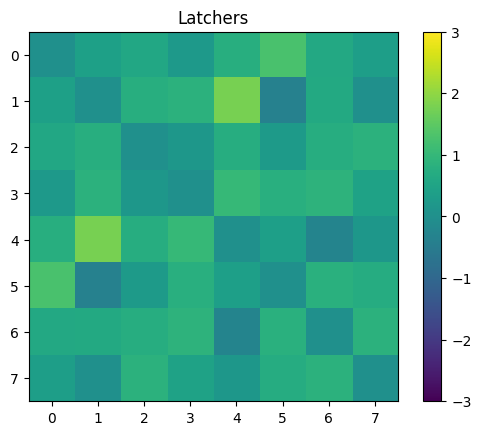

correlation_value is  [[0.20380623 0.10069204 0.10761246 0.09948097 0.10121107 0.11695502
  0.11297578 0.10449827]
 [0.10069204 0.19982699 0.12041522 0.10813149 0.13460208 0.08581315
  0.10276817 0.08927336]
 [0.10761246 0.12041522 0.20865052 0.10467128 0.11366782 0.09013841
  0.11557093 0.11107266]
 [0.09948097 0.10813149 0.10467128 0.2032872  0.11176471 0.10605536
  0.11470588 0.10121107]
 [0.10121107 0.13460208 0.11366782 0.11176471 0.20017301 0.09083045
  0.09653979 0.08512111]
 [0.11695502 0.08581315 0.09013841 0.10605536 0.09083045 0.20519031
  0.10259516 0.10951557]
 [0.11297578 0.10276817 0.11557093 0.11470588 0.09653979 0.10259516
  0.2050173  0.11262976]
 [0.10449827 0.08927336 0.11107266 0.10121107 0.08512111 0.10951557
  0.11262976 0.20640138]]
(256,)
cond 6, 7 and eps are:  0.00013890223786588995 0.00015279559069608311 1e-06
cond 6, 7 and eps are:  2.5231516038115576e-05 4.4533803691137975e-05 1e-06
cond 6, 7 and eps are:  7.536730563917349e-06 1.606499796965135e-05 1e-06


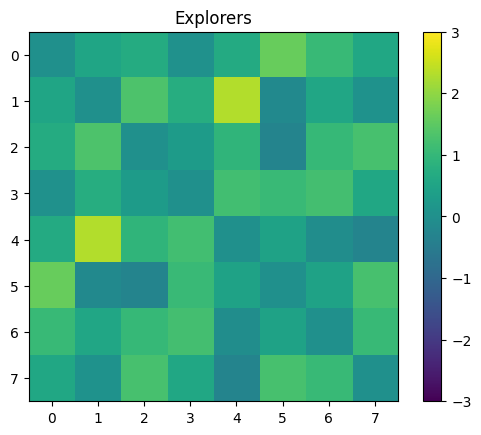

correlation_value is  [[0.5017301  0.24740484 0.26314879 0.2517301  0.26055363 0.29134948
  0.27145329 0.2517301 ]
 [0.24740484 0.4849481  0.27456747 0.27041522 0.3200692  0.21193772
  0.24878893 0.21764706]
 [0.26314879 0.27456747 0.4982699  0.25242215 0.2716263  0.23425606
  0.27231834 0.2650519 ]
 [0.2517301  0.27041522 0.25242215 0.49982699 0.28131488 0.26470588
  0.27768166 0.24809689]
 [0.26055363 0.3200692  0.2716263  0.28131488 0.49290657 0.23442907
  0.23373702 0.22041522]
 [0.29134948 0.21193772 0.23425606 0.26470588 0.23442907 0.50311419
  0.26401384 0.26366782]
 [0.27145329 0.24878893 0.27231834 0.27768166 0.23373702 0.26401384
  0.49896194 0.27110727]
 [0.2517301  0.21764706 0.2650519  0.24809689 0.22041522 0.26366782
  0.27110727 0.49930796]]
(256,)
cond 6, 7 and eps are:  0.00019612461067790082 4.643362714667782e-05 1e-06
cond 6, 7 and eps are:  2.9225385634643053e-05 6.905505156632483e-06 1e-06
cond 6, 7 and eps are:  4.236478946966632e-06 9.997301268202855e-07 1e-06


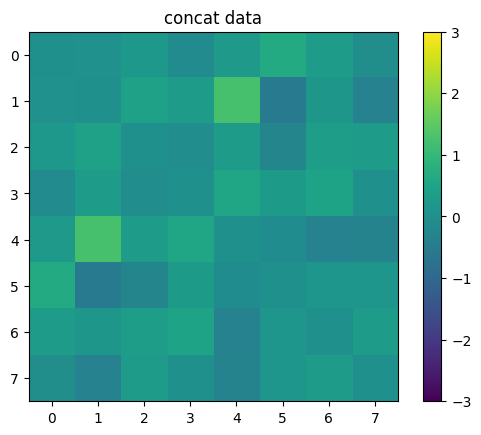

In [54]:
###### here we first define the fixed color range
vmin = -3
vmax = 3

plt.imshow(HandJ(np.array(DATA_LATCHERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.title('Latchers')
plt.colorbar()
plt.show()








# Plot for Explorers with fixed color range
plt.figure()
plt.title('Explorers')
plt.imshow(HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()










plt.figure()
plt.title('concat data')
plt.imshow(HandJ(np.array(data_p), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()


In [21]:
# V
# .shape
H_rand.shape
J_rand.shape
J_rand



array([[ 0.        ,  0.04676409,  0.20279135, -0.09869187,  0.24647134,
         0.65883065,  0.31922922, -0.02549364],
       [ 0.04676409,  0.        ,  0.42962752,  0.32786784,  1.25293213,
        -0.50429208,  0.16565711, -0.32928771],
       [ 0.20279135,  0.42962752,  0.        , -0.06594609,  0.32719966,
        -0.26431629,  0.37294862,  0.32612016],
       [-0.09869187,  0.32786784, -0.06594609,  0.        ,  0.52211352,
         0.27698716,  0.48496884,  0.00991707],
       [ 0.24647134,  1.25293213,  0.32719966,  0.52211352,  0.        ,
        -0.08765722, -0.34127691, -0.32461757],
       [ 0.65883065, -0.50429208, -0.26431629,  0.27698716, -0.08765722,
         0.        ,  0.15191452,  0.15287335],
       [ 0.31922922,  0.16565711,  0.37294862,  0.48496884, -0.34127691,
         0.15191452,  0.        ,  0.31527312],
       [-0.02549364, -0.32928771,  0.32612016,  0.00991707, -0.32461757,
         0.15287335,  0.31527312,  0.        ]])

# Hamiltonian Energy computation

In [76]:
def Hamiltonian(sigma_vec, h_vec, J_mat):



      first_term = np.dot(  h_vec , sigma_vec)

      # print('first term is' , first_term)


      second_term = 0

      N = len(sigma_vec)

      for i in range(N):
        for j in range(i+1, N):

          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])
          # print(i,j)

      second_term2 =   second_term


      energy = -(first_term + second_term2)
      # print(energy )

      return(energy)




In [16]:
J_mat.T == J_mat

array([[ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True]])

In [80]:
import pandas as pd
from collections import Counter


def data_frequency_probability(ROI,data ):
      # Define the 256 patterns, here len(h_vec) is 8 as we considered 8 networks
      patterns = [format(i, '07b') for i in range(2** ROI)]

      # Convert the dataframe to a list of tuples, where each tuple represents a row (sample)
      samples = [tuple(row) for _, row in pd.DataFrame(data).iterrows()]

      # Count the occurrences of each pattern using Counter
      pattern_frequency = Counter(samples)



      P_DATA = {}
      # Print the frequency count for each pattern
      for pattern, count in pattern_frequency.items():
          # print(f"Pattern: {pattern}, Frequency: {count}")
          # print('the pattern is ', str(pattern))

          # p = list(pattern)
          P_DATA[pattern] = count / len(data)



      return(P_DATA,pattern_frequency)



P_DATA, pattern_frequency = data_frequency_probability(ROI,data )



P_DATA_LATCHER, pattern_frequency_LATCHER = data_frequency_probability(ROI,DATA_LATCHERS )

P_DATA_EXPLORER, pattern_frequency_EXPLORER = data_frequency_probability(ROI,DATA_EXPLORERS )




In [56]:

P_DATA



P_DATA_EXPLORER

P_DATA_LATCHER

{(1, 1, 0, 1, 1, 0, 1, 0): 0.003823529411764706,
 (1, 1, 1, 1, 0, 0, 1, 1): 0.0026470588235294116,
 (1, 1, 0, 0, 0, 0, 1, 0): 0.002352941176470588,
 (0, 1, 1, 0, 1, 0, 0, 0): 0.006470588235294118,
 (1, 1, 1, 1, 0, 0, 0, 1): 0.002352941176470588,
 (1, 1, 1, 0, 1, 0, 0, 1): 0.005294117647058823,
 (1, 1, 1, 1, 0, 1, 1, 1): 0.006176470588235294,
 (0, 0, 0, 0, 0, 1, 0, 0): 0.006470588235294118,
 (0, 0, 0, 0, 0, 0, 0, 0): 0.012647058823529412,
 (1, 1, 1, 0, 0, 1, 0, 0): 0.0017647058823529412,
 (1, 1, 1, 0, 1, 1, 1, 1): 0.0058823529411764705,
 (1, 0, 0, 0, 1, 1, 0, 0): 0.005588235294117647,
 (1, 0, 1, 0, 1, 1, 0, 0): 0.0026470588235294116,
 (1, 0, 0, 0, 1, 1, 1, 1): 0.0017647058823529412,
 (1, 1, 0, 0, 1, 1, 0, 1): 0.0017647058823529412,
 (1, 1, 0, 1, 0, 1, 1, 0): 0.004705882352941176,
 (0, 0, 0, 0, 0, 1, 1, 1): 0.007058823529411765,
 (0, 0, 0, 1, 0, 1, 0, 1): 0.005,
 (0, 0, 1, 1, 0, 0, 1, 0): 0.0029411764705882353,
 (1, 0, 1, 1, 1, 0, 1, 0): 0.0026470588235294116,
 (0, 0, 1, 1, 1, 1, 0, 1): 

In [24]:
pattern_frequency

Counter({(1, 1, 0, 1, 1, 0, 1, 0): 25,
         (1, 1, 1, 1, 0, 0, 1, 1): 26,
         (1, 1, 0, 0, 0, 0, 1, 0): 11,
         (0, 1, 1, 0, 1, 0, 0, 0): 50,
         (1, 1, 1, 1, 0, 0, 0, 1): 11,
         (1, 1, 1, 0, 1, 0, 0, 1): 28,
         (1, 1, 1, 1, 0, 1, 1, 1): 35,
         (0, 0, 0, 0, 0, 1, 0, 0): 42,
         (0, 0, 0, 0, 0, 0, 0, 0): 74,
         (1, 1, 1, 0, 0, 1, 0, 0): 15,
         (1, 1, 1, 0, 1, 1, 1, 1): 36,
         (1, 0, 0, 0, 1, 1, 0, 0): 27,
         (1, 0, 1, 0, 1, 1, 0, 0): 11,
         (1, 0, 0, 0, 1, 1, 1, 1): 12,
         (1, 1, 0, 0, 1, 1, 0, 1): 11,
         (1, 1, 0, 1, 0, 1, 1, 0): 18,
         (0, 0, 0, 0, 0, 1, 1, 1): 49,
         (0, 0, 0, 1, 0, 1, 0, 1): 32,
         (0, 0, 1, 1, 0, 0, 1, 0): 17,
         (1, 0, 1, 1, 1, 0, 1, 0): 17,
         (0, 0, 1, 1, 1, 1, 0, 1): 13,
         (0, 0, 0, 1, 1, 0, 0, 1): 17,
         (0, 0, 0, 0, 0, 0, 1, 1): 42,
         (1, 1, 1, 0, 1, 1, 1, 0): 27,
         (0, 1, 1, 0, 1, 1, 0, 0): 20,
         (1, 1, 1, 0, 0, 

In [17]:
np.array(list(P_DATA.values())).sum()


np.array(list(P_DATA_EXPLORER.values())).sum()

np.array(list(P_DATA_LATCHER.values())).sum()


1.0

In [18]:

np.array(list(pattern_frequency.values())).sum()

np.array(list(pattern_frequency_EXPLORER.values())).sum()


np.array(list(pattern_frequency_LATCHER.values())).sum()



6110

In [19]:
data.shape
len(data)

10651

In [18]:
# PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations




In [43]:
for i in range(8):

  for j in range(8):

    if i ==j :
      print(J_rand[i,j])
# J_rand

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [57]:

###### fateme's energy computation:



# sigma = [0,1]
# V = np.array(list(itertools.product(sigma, repeat = ROI)))

# 'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
# #energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

# dis_graph = np.zeros((2**ROI,2**ROI))
# E = np.zeros(2**ROI)

# H_rand, J_rand = HandJ(data_p, ROI, l_t)
# E = -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))

# for i in range(2**ROI):
#   V_k = V[i]
#   for j in range(2**ROI):
#     metric = np.sum(abs(V[i]-V[j]))
#     if metric == 1:
#       dis_graph[i][j] = 1

# # probability
# P = np.exp(-E)/np.sum(np.exp(-E))






# for i in range(2**ROI):

#   print(tuple(V[i,:]))




  # PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):





    sigma = [0,1]
    V = np.array(list(itertools.product(sigma, repeat = ROI)))

    # 'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
    #energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

    # dis_graph = np.zeros((2**ROI,2**ROI))



    E = np.zeros(2**ROI)

    # H_rand, J_rand = HandJ(data_p, ROI, l_t)
    E = -1 * np.dot(h_vec, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_mat), V.T))

    # for i in range(2**ROI):
    #   V_k = V[i]
    #   for j in range(2**ROI):
    #     metric = np.sum(abs(V[i]-V[j]))
    #     if metric == 1:
    #       dis_graph[i][j] = 1

    # probability
    P = np.exp(-E)/np.sum(np.exp(-E))






#  fateme's code:











    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]
    for i in range(2**N):


        combinations.append([list(V[i,:]), E[i]])

    return combinations



#### Frequency VS Patterns

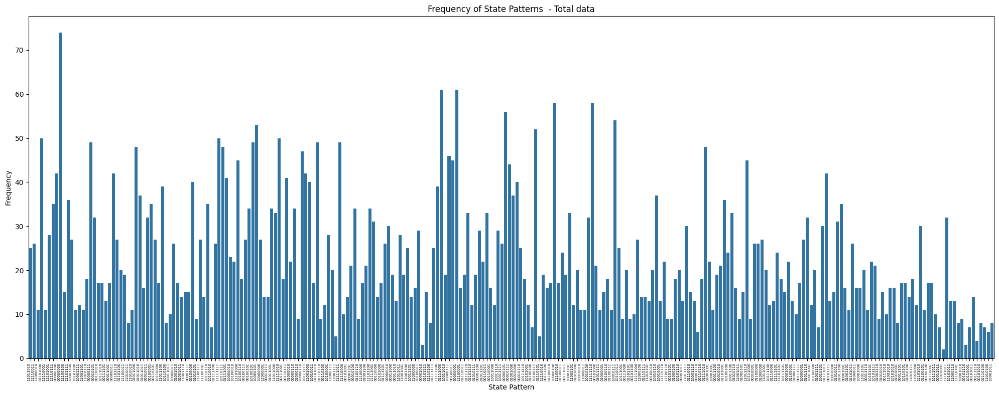

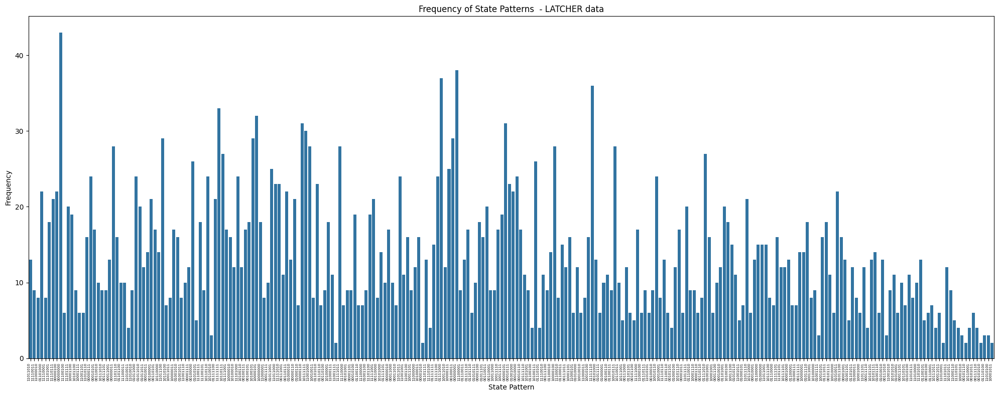

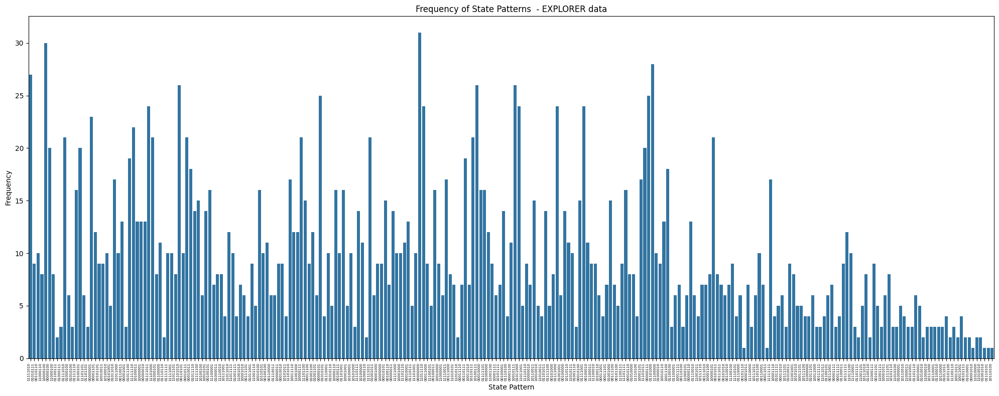

In [29]:

import matplotlib.pyplot as plt
import seaborn as sns

# Extract the patterns and corresponding counts as separate lists
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency.keys()]
frequencies = list(pattern_frequency.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies)


n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - Total data')

plt.tight_layout()
plt.show()

















counts_LATCHER = list(pattern_frequency_LATCHER.values())
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_LATCHER.keys()]
frequencies_LATCHER = list(pattern_frequency_LATCHER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_LATCHER)


# # working on xticks:
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - LATCHER data')

plt.tight_layout()
plt.show()


























counts_EXPLORER = list(pattern_frequency_EXPLORER.values())
pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_EXPLORER.keys()]
frequencies_EXPLORER = list(pattern_frequency_EXPLORER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_EXPLORER)


# # working on xticks:
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - EXPLORER data')

plt.tight_layout()
plt.show()



















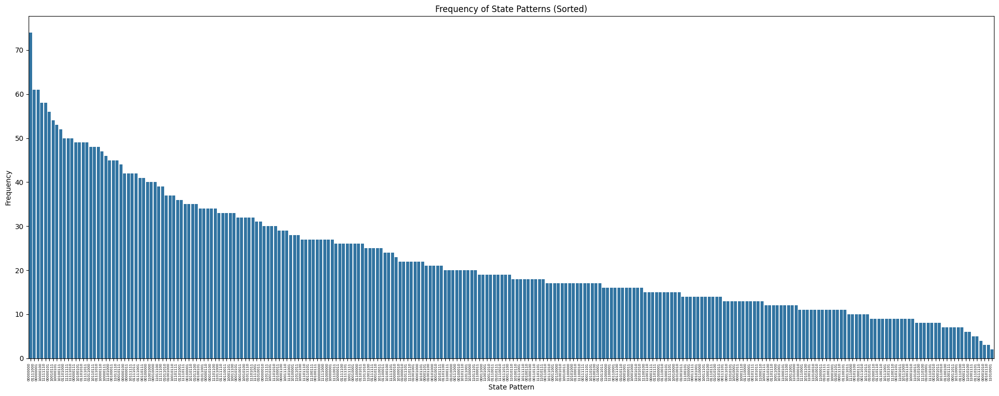

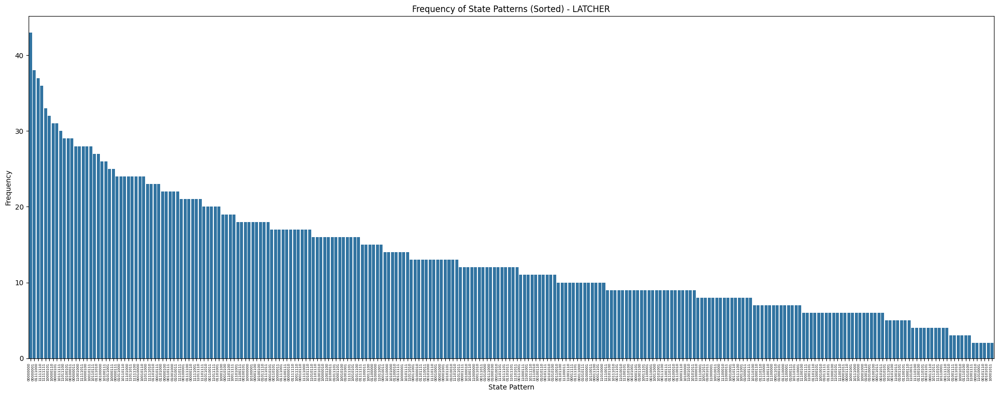

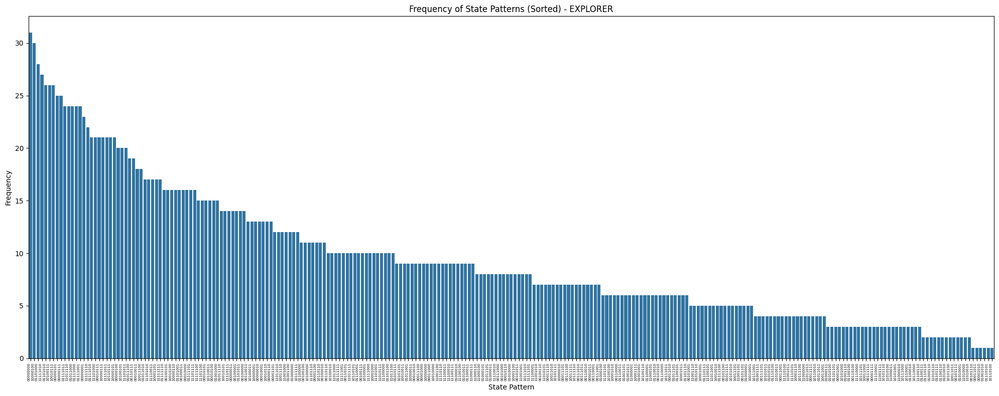

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the pattern frequency by the frequency values in descending order
sorted_patterns = sorted(pattern_frequency.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted = [''.join(map(str, key)) for key, value in sorted_patterns]
frequencies_sorted = [value for key, value in sorted_patterns]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted, y=frequencies_sorted)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted)')

plt.tight_layout()
plt.show()




























sorted_patterns_LATCHER = sorted(pattern_frequency_LATCHER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_LATCHER = [''.join(map(str, key)) for key, value in sorted_patterns_LATCHER]
frequencies_sorted_LATCHER = [value for key, value in sorted_patterns_LATCHER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_LATCHER, y=frequencies_sorted_LATCHER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - LATCHER')

plt.tight_layout()
plt.show()






























sorted_patterns_EXPLORER = sorted(pattern_frequency_EXPLORER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_EXPLORER = [''.join(map(str, key)) for key, value in sorted_patterns_EXPLORER]
frequencies_sorted_EXPLORER = [value for key, value in sorted_patterns_EXPLORER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_EXPLORER, y=frequencies_sorted_EXPLORER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - EXPLORER')

plt.tight_layout()
plt.show()




In [36]:

J_mat.shape

(8, 8)

## Generating Patterns and their energy

### Fateme version's energy computation

In [65]:
###### fateme's energy computation:



# sigma = [0,1]
# V = np.array(list(itertools.product(sigma, repeat = ROI)))

# 'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
# #energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

# dis_graph = np.zeros((2**ROI,2**ROI))
# E = np.zeros(2**ROI)

# H_rand, J_rand = HandJ(data_p, ROI, l_t)
# E = -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))

# for i in range(2**ROI):
#   V_k = V[i]
#   for j in range(2**ROI):
#     metric = np.sum(abs(V[i]-V[j]))
#     if metric == 1:
#       dis_graph[i][j] = 1

# # probability
# P = np.exp(-E)/np.sum(np.exp(-E))






# for i in range(2**ROI):

#   print(tuple(V[i,:]))




  # PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):





    sigma = [0,1]
    V = np.array(list(itertools.product(sigma, repeat = ROI)))

    # 'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
    #energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

    # dis_graph = np.zeros((2**ROI,2**ROI))



    E = np.zeros(2**ROI)

    # H_rand, J_rand = HandJ(data_p, ROI, l_t)
    E = -1 * np.dot(h_vec, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_mat), V.T))

    # for i in range(2**ROI):
    #   V_k = V[i]
    #   for j in range(2**ROI):
    #     metric = np.sum(abs(V[i]-V[j]))
    #     if metric == 1:
    #       dis_graph[i][j] = 1

    # probability
    P = np.exp(-E)/np.sum(np.exp(-E))






#  fateme's code:











    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]
    for i in range(2**N):


        combinations.append([list(V[i,:]), E[i]])

    return combinations



In [82]:

N = ROI
patterns = generate_combinations(N,h_vec, J_mat)
# patterns[1][0]
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.07197779591875775],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7386500724880002],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.49535474510311744],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.18851290451479077],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.10761735076612308],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.7752484583380655],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.37907978128575737],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.80990990045543],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.206505264172824],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.8898368782613315],
 [[0, 0, 0, 0, 1, 0, 1, 1], 1.971159118675085],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.086080029226225],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.3298020432761932],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.0140924883674014],
 [[0, 0, 0, 0, 1, 1, 1, 1], 1.942541379113729],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.7208586168129357],
 [[0, 0, 0, 1, 0, 0, 0, 1], 0.7829193457514285],
 [[0, 0, 0, 1, 0, 0, 1, 0], 0.9745398450657539],
 [[0, 0, 0, 1, 0, 0, 1, 1], 0.7213274507006063],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.63238

### My energy computation

In [77]:
# PATTERNS = np.array()
#


def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations


## P_MODEL vs P_DATA

In [83]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns



patterns_LATCHER = generate_combinations(N,H_latcher, J_latcher)
# patterns





patterns_EXPLORER = generate_combinations(N,H_explorers, J_explorers)
# patterns








In [60]:
patterns_LATCHER

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.06771348230280265],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.6883274610901041],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.45510617436153245],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.3180457858863154],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.28511364981097737],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.7092806340041485],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.3754137288974363],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.8593179725120514],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.1196852628439269],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.9433768123046506],
 [[0, 0, 0, 0, 1, 0, 1, 1], 1.902809333605152],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.2061505765631828],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.3658722485169175],
 [[0, 0, 0, 0, 1, 1, 1, 0], 1.993116803383511],
 [[0, 0, 0, 0, 1, 1, 1, 1], 1.8519037063058716],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.742487356310546],
 [[0, 0, 0, 1, 0, 0, 0, 1], 0.7989226240410967],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.0031025960748363],
 [[0, 0, 0, 1, 0, 0, 1, 1], 0.7586030947740127],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.7823

In [73]:
patterns_EXPLORER

[[[0, 0, 0, 0, 0, 0, 0, 0], nan],
 [[0, 0, 0, 0, 0, 0, 0, 1], nan],
 [[0, 0, 0, 0, 0, 0, 1, 0], nan],
 [[0, 0, 0, 0, 0, 0, 1, 1], nan],
 [[0, 0, 0, 0, 0, 1, 0, 0], nan],
 [[0, 0, 0, 0, 0, 1, 0, 1], nan],
 [[0, 0, 0, 0, 0, 1, 1, 0], nan],
 [[0, 0, 0, 0, 0, 1, 1, 1], nan],
 [[0, 0, 0, 0, 1, 0, 0, 0], nan],
 [[0, 0, 0, 0, 1, 0, 0, 1], nan],
 [[0, 0, 0, 0, 1, 0, 1, 0], nan],
 [[0, 0, 0, 0, 1, 0, 1, 1], nan],
 [[0, 0, 0, 0, 1, 1, 0, 0], nan],
 [[0, 0, 0, 0, 1, 1, 0, 1], nan],
 [[0, 0, 0, 0, 1, 1, 1, 0], nan],
 [[0, 0, 0, 0, 1, 1, 1, 1], nan],
 [[0, 0, 0, 1, 0, 0, 0, 0], nan],
 [[0, 0, 0, 1, 0, 0, 0, 1], nan],
 [[0, 0, 0, 1, 0, 0, 1, 0], nan],
 [[0, 0, 0, 1, 0, 0, 1, 1], nan],
 [[0, 0, 0, 1, 0, 1, 0, 0], nan],
 [[0, 0, 0, 1, 0, 1, 0, 1], nan],
 [[0, 0, 0, 1, 0, 1, 1, 0], nan],
 [[0, 0, 0, 1, 0, 1, 1, 1], nan],
 [[0, 0, 0, 1, 1, 0, 0, 0], nan],
 [[0, 0, 0, 1, 1, 0, 0, 1], nan],
 [[0, 0, 0, 1, 1, 0, 1, 0], nan],
 [[0, 0, 0, 1, 1, 0, 1, 1], nan],
 [[0, 0, 0, 1, 1, 1, 0, 0], nan],
 [[0, 0, 0, 1,

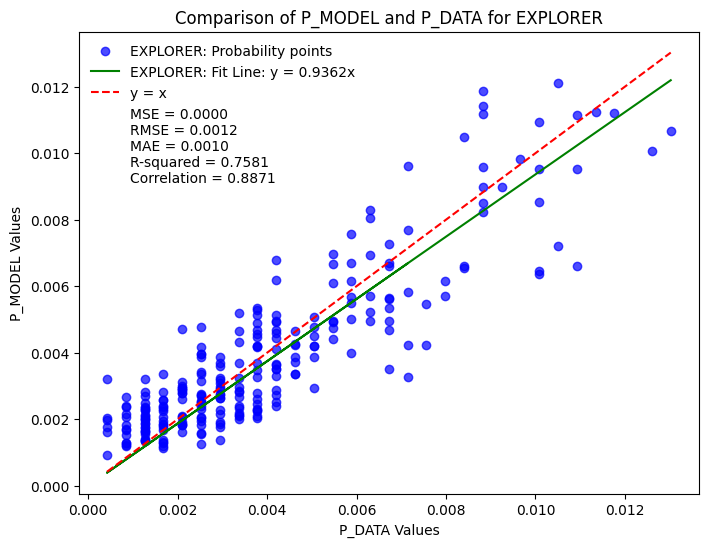

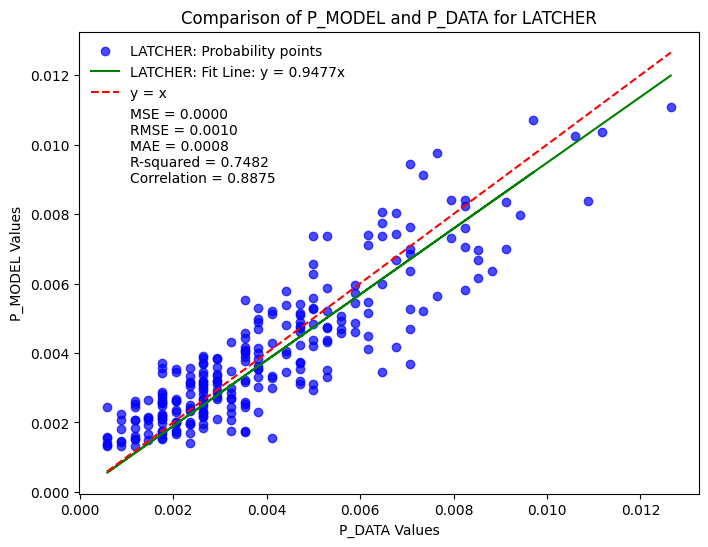

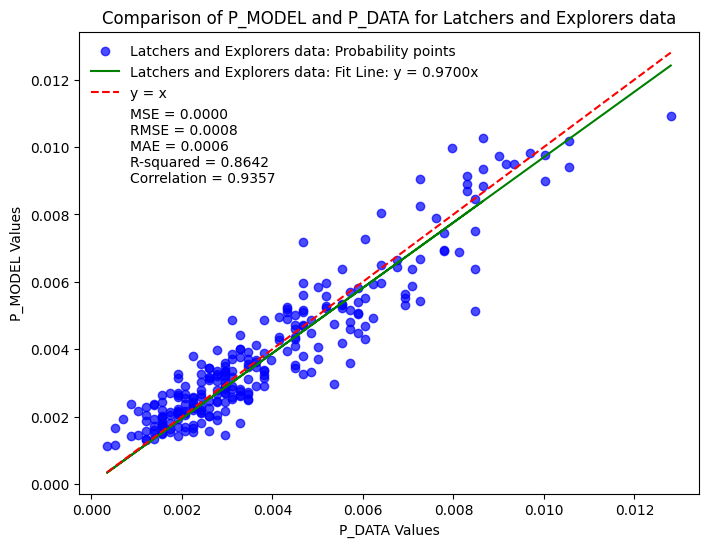

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import nnls
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from matplotlib.lines import Line2D





def data_probability(patterns):

        E = []
        P = []
        for m in patterns:
          # print(p,e)

          P.append(m[0])
          E.append(m[1])
          # print(p,e)
        # p


        E = np.array(E)
        total_E = (np.exp(-E)).sum()
        total_E



        # .sum()



        P_MODEL = {}


        for p,e in zip(P,E):

          P_MODEL[tuple(p)] = (np.exp(-e)) / total_E

        return(P_MODEL)





P_MODEL = data_probability(patterns)


P_MODEL_LATCHER = data_probability(patterns_LATCHER)

P_MODEL_EXPLORER = data_probability(patterns_EXPLORER)









Pmerged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')






Pdf_model_EXPLORER = pd.DataFrame(list(P_MODEL_EXPLORER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_EXPLORER = pd.DataFrame(list(P_DATA_EXPLORER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_EXPLORER = pd.merge(Pdf_model_EXPLORER, Pdf_data_EXPLORER, on='Pattern', how='inner')
















# Function to compute accuracy metrics and plot for each dataset
def plot_comparison(P_MODEL, P_DATA, dataset_name):
    Pdf_model = pd.DataFrame(list(P_MODEL.items()), columns=['Pattern', 'P_MODEL'])
    Pdf_data = pd.DataFrame(list(P_DATA.items()), columns=['Pattern', 'P_DATA'])

    # Step 2: Perform inner join on 'Pattern'
    merged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')

    # Fit the best line using NNLS
    m, _ = nnls(merged_df['P_DATA'].values.reshape(-1, 1), merged_df['P_MODEL'].values)

    # Predicted values using the fitted line
    P_MODEL_pred = m[0] * merged_df['P_DATA'].values

    # Calculate accuracy metrics
    mse = mean_squared_error(merged_df['P_MODEL'], P_MODEL_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(merged_df['P_MODEL'], P_MODEL_pred)
    r2 = r2_score(merged_df['P_MODEL'], P_MODEL_pred)

    # Compute correlation coefficient between P_DATA and P_MODEL
    correlation = np.corrcoef(merged_df['P_DATA'], merged_df['P_MODEL'])[0, 1]

    # Plot the data points and the fit line
    plt.figure(figsize=(8, 6))
    plt.scatter(merged_df['P_DATA'], merged_df['P_MODEL'], color='blue', alpha=0.7, label=f'{dataset_name}: Probability points')
    plt.plot(merged_df['P_DATA'], P_MODEL_pred, color='green', label=f'{dataset_name}: Fit Line: y = {m[0]:.4f}x')

    # Add the y = x reference line
    x_vals = np.linspace(min(merged_df['P_MODEL'].min(), merged_df['P_DATA'].min()),
                         max(merged_df['P_MODEL'].max(), merged_df['P_DATA'].max()), 100)
    plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

    # Prepare metrics text
    metrics_text = (
        f'MSE = {mse:.4f}\n'
        f'RMSE = {rmse:.4f}\n'
        f'MAE = {mae:.4f}\n'
        f'R-squared = {r2:.4f}\n'
        f'Correlation = {correlation:.4f}'
    )

    # Create a custom legend handle for the accuracy metrics
    metrics_legend = Line2D([0], [0], color='white', label=metrics_text)  # Invisible line to hold the text

    # Add labels and title
    plt.ylabel('P_MODEL Values')
    plt.xlabel('P_DATA Values')
    plt.title(f'Comparison of P_MODEL and P_DATA for {dataset_name}')

    # Combine the legend entries: plot elements and metrics in one call
    handles, labels = plt.gca().get_legend_handles_labels()  # Get existing handles and labels
    handles.append(metrics_legend)  # Add the custom metrics legend
    labels.append(metrics_text)  # Add the custom metrics text

    plt.legend(handles=handles, labels=labels, loc='upper left', frameon=False)  # Add all to the same legend box
    plt.show()





# Dataset 1: EXPLORER
plot_comparison(P_MODEL_EXPLORER, P_DATA_EXPLORER, "EXPLORER")

# Dataset 2: LATCHER
plot_comparison(P_MODEL_LATCHER, P_DATA_LATCHER, "LATCHER")

# Dataset 3: Default (replace P_MODEL, P_DATA with actual dataset)
plot_comparison(P_MODEL, P_DATA, "Latchers and Explorers data")


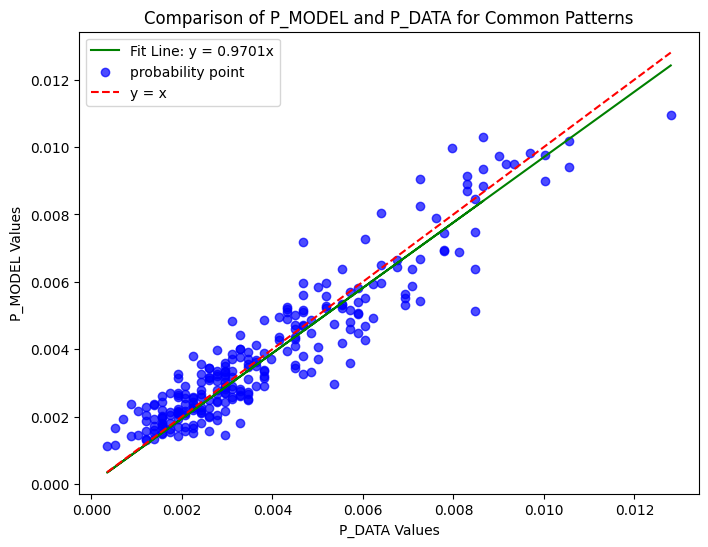

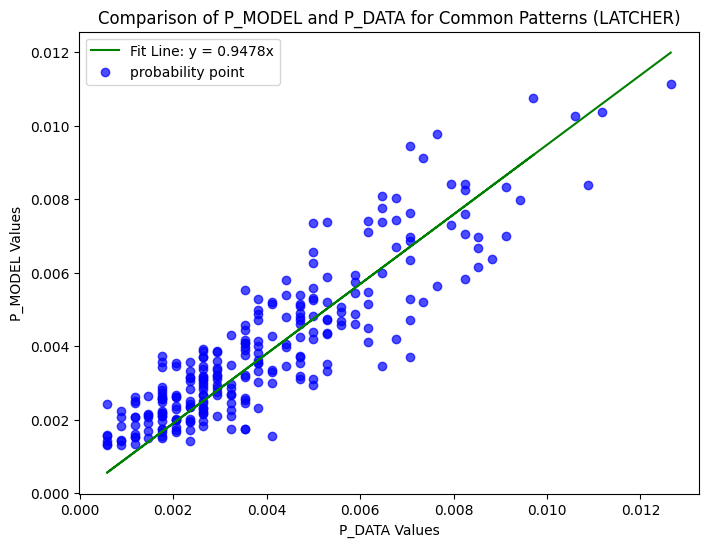

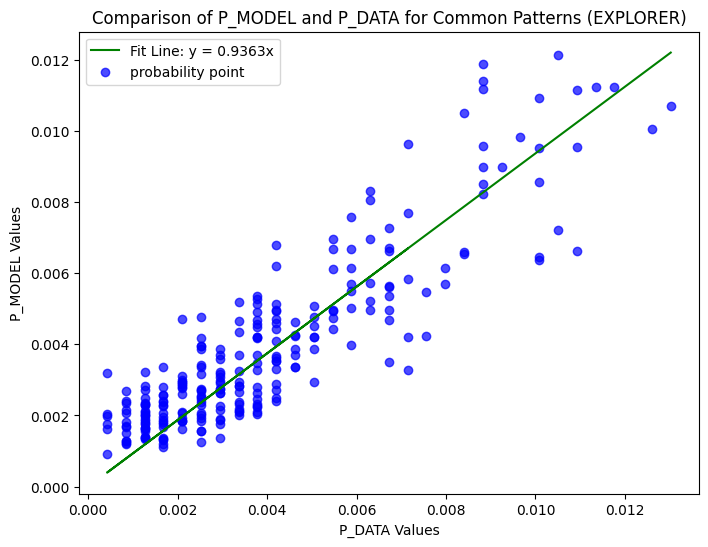

In [85]:


def data_probability(patterns):

        E = []
        P = []
        for m in patterns:
          # print(p,e)

          P.append(m[0])
          E.append(m[1])
          # print(p,e)
        # p


        E = np.array(E)
        total_E = (np.exp(-E)).sum()
        total_E



        # .sum()



        P_MODEL = {}


        for p,e in zip(P,E):

          P_MODEL[tuple(p)] = (np.exp(-e)) / total_E

        return(P_MODEL)





P_MODEL = data_probability(patterns)


P_MODEL_LATCHER = data_probability(patterns_LATCHER)

P_MODEL_EXPLORER = data_probability(patterns_EXPLORER)































Pdf_model = pd.DataFrame(list(P_MODEL.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data = pd.DataFrame(list(P_DATA.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m, _ = nnls(Pmerged_df['P_DATA'].values.reshape(-1,1), Pmerged_df['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df['P_DATA'], m * Pmerged_df['P_DATA'], color='green', label=f'Fit Line: y = {m[0]:.4f}x')



plt.scatter( Pmerged_df['P_DATA'],Pmerged_df['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df['P_MODEL'].min(), Pmerged_df['P_DATA'].min()),
                     max(Pmerged_df['P_MODEL'].max(), Pmerged_df['P_DATA'].max()), 100)
plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns')
plt.legend()

plt.show()































Pdf_model_LATCHER = pd.DataFrame(list(P_MODEL_LATCHER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_LATCHER = pd.DataFrame(list(P_DATA_LATCHER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_LATCHER = pd.merge(Pdf_model_LATCHER, Pdf_data_LATCHER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m2, _ = nnls(Pmerged_df_LATCHER['P_DATA'].values.reshape(-1,1), Pmerged_df_LATCHER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_LATCHER['P_DATA'], m2 * Pmerged_df_LATCHER['P_DATA'], color='green', label=f'Fit Line: y = {m2[0]:.4f}x')



plt.scatter( Pmerged_df_LATCHER['P_DATA'],Pmerged_df_LATCHER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_LATCHER['P_MODEL'].min(), Pmerged_df_LATCHER['P_DATA'].min()),
                     max(Pmerged_df_LATCHER['P_MODEL'].max(), Pmerged_df_LATCHER['P_DATA'].max()), 100)
# plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (LATCHER)')
plt.legend()

plt.show()


































Pdf_model_EXPLORER = pd.DataFrame(list(P_MODEL_EXPLORER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_EXPLORER = pd.DataFrame(list(P_DATA_EXPLORER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_EXPLORER = pd.merge(Pdf_model_EXPLORER, Pdf_data_EXPLORER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m3, _ = nnls(Pmerged_df_EXPLORER['P_DATA'].values.reshape(-1,1), Pmerged_df_EXPLORER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_EXPLORER['P_DATA'], m3 * Pmerged_df_EXPLORER['P_DATA'], color='green', label=f'Fit Line: y = {m3[0]:.4f}x')



plt.scatter( Pmerged_df_EXPLORER['P_DATA'],Pmerged_df_EXPLORER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_EXPLORER['P_MODEL'].min(), Pmerged_df_EXPLORER['P_DATA'].min()),
                     max(Pmerged_df_EXPLORER['P_MODEL'].max(), Pmerged_df_EXPLORER['P_DATA'].max()), 100)
# plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (EXPLORER)')
plt.legend()
plt.show()


In [26]:
np.max(Pmerged_df_EXPLORER['P_DATA'])

0.01607575423915437

In [23]:
P_DATA

{(1, 1, 1, 1, 1, 0, 0, 1): 0.007698807623697306,
 (0, 0, 1, 0, 1, 1, 0, 0): 0.0029105248333489812,
 (0, 0, 1, 1, 1, 1, 1, 0): 0.002159421650549244,
 (0, 1, 0, 1, 0, 1, 1, 1): 0.004694394892498357,
 (0, 0, 0, 1, 0, 1, 0, 0): 0.006008825462397897,
 (0, 0, 1, 0, 1, 0, 0, 0): 0.006853816543047601,
 (0, 0, 1, 1, 0, 0, 0, 0): 0.0030044127311989483,
 (0, 1, 1, 1, 1, 0, 0, 0): 0.0072293681344474696,
 (0, 1, 1, 0, 1, 1, 0, 0): 0.001408318467749507,
 (0, 0, 1, 1, 1, 1, 1, 1): 0.0023471974462491783,
 (0, 0, 0, 1, 0, 1, 1, 0): 0.004788282790348324,
 (0, 1, 0, 0, 0, 0, 1, 0): 0.004976058586048259,
 (0, 1, 0, 0, 1, 1, 1, 1): 0.0018777579569993427,
 (0, 0, 0, 0, 0, 1, 0, 1): 0.00985822927424655,
 (0, 1, 1, 1, 1, 0, 0, 1): 0.0071354802365975025,
 (0, 1, 1, 0, 0, 0, 0, 0): 0.002816636935499014,
 (1, 1, 1, 0, 1, 1, 0, 0): 0.00328607642474885,
 (1, 1, 1, 1, 0, 0, 1, 1): 0.004694394892498357,
 (0, 0, 0, 0, 0, 0, 1, 0): 0.007792695521547273,
 (1, 0, 1, 0, 1, 0, 0, 0): 0.004131067505398554,
 (1, 1, 1, 0, 0,

In [27]:
Pmerged_df['P_MODEL'].values.reshape(-1,1).shape


(256, 1)

In [89]:

Pdf_data = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')

Pdf_data['P_DATA'].sum()

1.0

In [90]:

Pdf_model['P_MODEL'].sum()

1.0000000000000002

In [86]:
from scipy.stats import pearsonr
R, _ = pearsonr(Pmerged_df['P_DATA'], Pmerged_df['P_MODEL'])
print(R)

0.9357216026770493


In [87]:
from scipy.stats import pearsonr
R_LATCHER, _ = pearsonr(Pmerged_df_LATCHER['P_DATA'], Pmerged_df_LATCHER['P_MODEL'])
print(R_LATCHER)

0.8875407592297382


In [88]:
from scipy.stats import pearsonr
R_EXPLORER, _ = pearsonr(Pmerged_df_EXPLORER['P_DATA'], Pmerged_df_EXPLORER['P_MODEL'])
print(R_EXPLORER)

0.8871298715371502


In [ ]:
H_

In [67]:



N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns




edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges.append((i+1,j+1))
        print(i+1,j+1, patterns[i][0], patterns[j][0])


edges


















edges_LATCHER = []

for i in range(len(patterns_LATCHER)):
  for j in range(len(patterns_LATCHER)):
    if i <= j:
      differences = np.abs(np.array(patterns_LATCHER[i][0]) - np.array(patterns_LATCHER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_LATCHER.append((i+1,j+1))
        # print(i+1,j+1, patterns_LATCHER[i][0], patterns_LATCHER[j][0])


edges_LATCHER








edges_EXPLORER = []

for i in range(len(patterns_EXPLORER)):
  for j in range(len(patterns_EXPLORER)):
    if i <= j:
      differences = np.abs(np.array(patterns_EXPLORER[i][0]) - np.array(patterns_EXPLORER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_EXPLORER.append((i+1,j+1))
        # print(i+1,j+1, patterns[i][0], patterns[j][0])


edges_EXPLORER

1 2 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 0, 1]
1 3 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 1, 0]
1 5 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 1, 0, 0]
1 9 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 1, 0, 0, 0]
1 17 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 1, 0, 0, 0, 0]
1 33 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 1, 0, 0, 0, 0, 0]
1 65 [0, 0, 0, 0, 0, 0, 0, 0] [0, 1, 0, 0, 0, 0, 0, 0]
1 129 [0, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 0, 0, 0]
2 4 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 0, 0, 1, 1]
2 6 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 0, 1, 0, 1]
2 10 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 1, 0, 0, 1]
2 18 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 1, 0, 0, 0, 1]
2 34 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 1, 0, 0, 0, 0, 1]
2 66 [0, 0, 0, 0, 0, 0, 0, 1] [0, 1, 0, 0, 0, 0, 0, 1]
2 130 [0, 0, 0, 0, 0, 0, 0, 1] [1, 0, 0, 0, 0, 0, 0, 1]
3 4 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 0, 0, 1, 1]
3 7 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 0, 1, 1, 0]
3 11 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 1, 0, 1, 0]
3 19 [0, 0, 0, 0

[(1, 2),
 (1, 3),
 (1, 5),
 (1, 9),
 (1, 17),
 (1, 33),
 (1, 65),
 (1, 129),
 (2, 4),
 (2, 6),
 (2, 10),
 (2, 18),
 (2, 34),
 (2, 66),
 (2, 130),
 (3, 4),
 (3, 7),
 (3, 11),
 (3, 19),
 (3, 35),
 (3, 67),
 (3, 131),
 (4, 8),
 (4, 12),
 (4, 20),
 (4, 36),
 (4, 68),
 (4, 132),
 (5, 6),
 (5, 7),
 (5, 13),
 (5, 21),
 (5, 37),
 (5, 69),
 (5, 133),
 (6, 8),
 (6, 14),
 (6, 22),
 (6, 38),
 (6, 70),
 (6, 134),
 (7, 8),
 (7, 15),
 (7, 23),
 (7, 39),
 (7, 71),
 (7, 135),
 (8, 16),
 (8, 24),
 (8, 40),
 (8, 72),
 (8, 136),
 (9, 10),
 (9, 11),
 (9, 13),
 (9, 25),
 (9, 41),
 (9, 73),
 (9, 137),
 (10, 12),
 (10, 14),
 (10, 26),
 (10, 42),
 (10, 74),
 (10, 138),
 (11, 12),
 (11, 15),
 (11, 27),
 (11, 43),
 (11, 75),
 (11, 139),
 (12, 16),
 (12, 28),
 (12, 44),
 (12, 76),
 (12, 140),
 (13, 14),
 (13, 15),
 (13, 29),
 (13, 45),
 (13, 77),
 (13, 141),
 (14, 16),
 (14, 30),
 (14, 46),
 (14, 78),
 (14, 142),
 (15, 16),
 (15, 31),
 (15, 47),
 (15, 79),
 (15, 143),
 (16, 32),
 (16, 48),
 (16, 80),
 (16, 144),


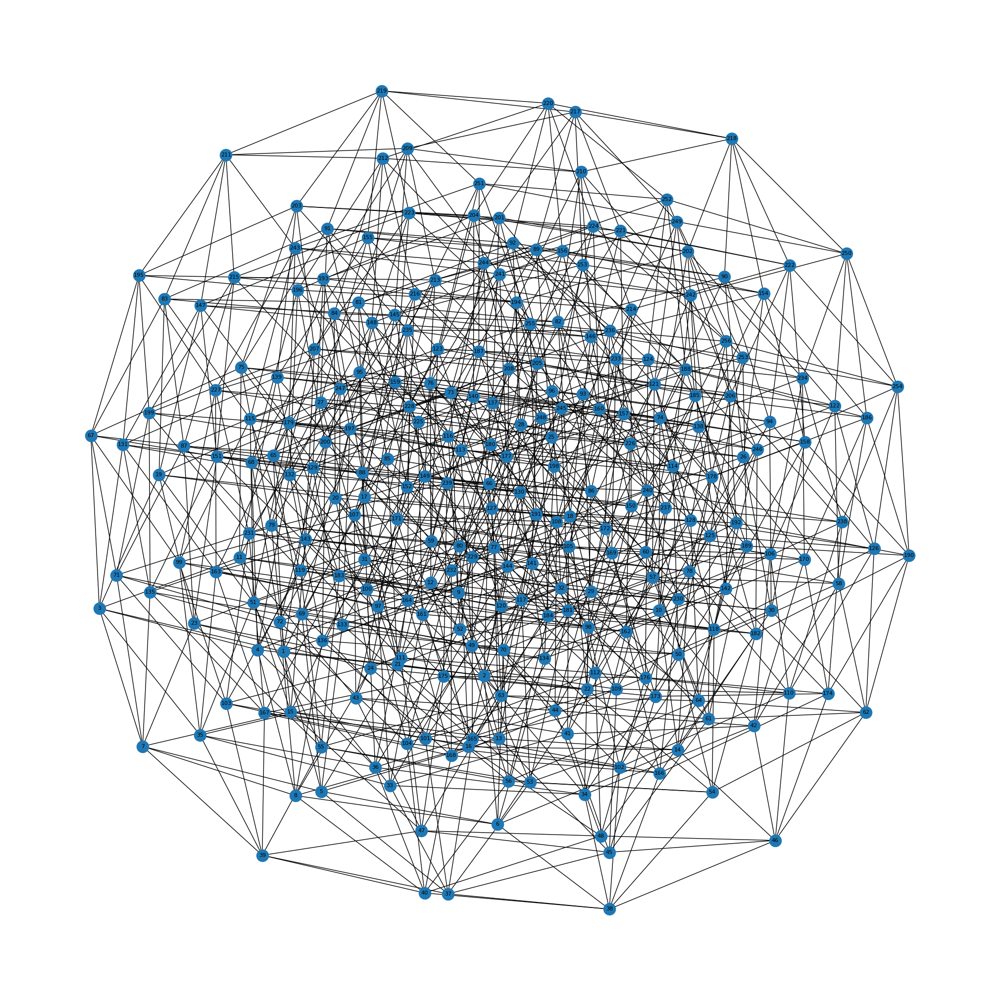

In [68]:

# creating the graph of the patterns :
edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))





G = nx.Graph()

G.add_edges_from(edges)

# nx.draw(G, with_labels=True)
# plt.show()



# pos=nx.spring_layout(G) #default to scale=1

# nx.draw(G,pos)
# pos=nx.spring_layout(G,scale=.5) # double distance between all nodes

# nx.draw(G,pos, with_labels=True)


pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))

nx.draw(G,pos,font_size=8, with_labels=True)

#nx.draw(G,pos,font_size=10)











Text(0.5, 1.0, 'LATCHER')

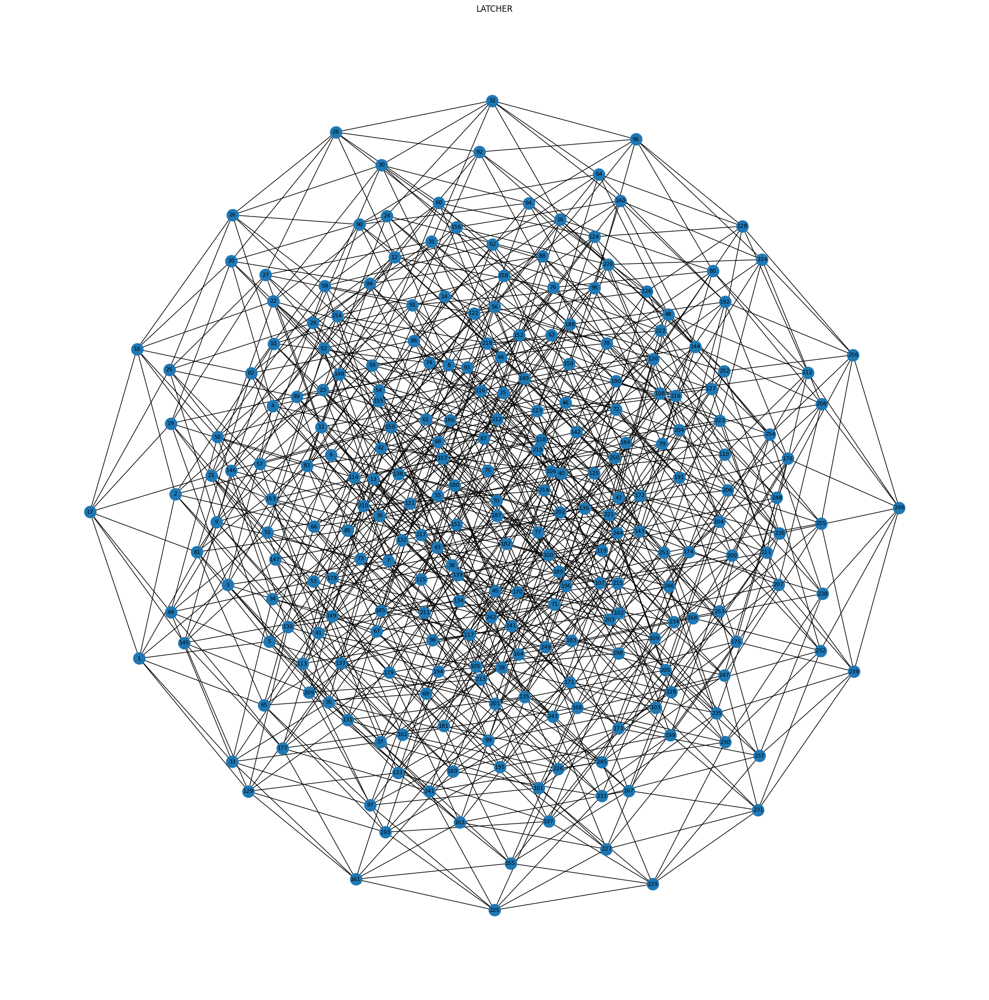

In [69]:


G_LATCHER = nx.Graph()

G_LATCHER.add_edges_from(edges_LATCHER)


pos=nx.spring_layout(G_LATCHER)
plt.figure(1,figsize=(20,20))
nx.draw(G_LATCHER,pos,font_size=8, with_labels=True)
plt.title('LATCHER')



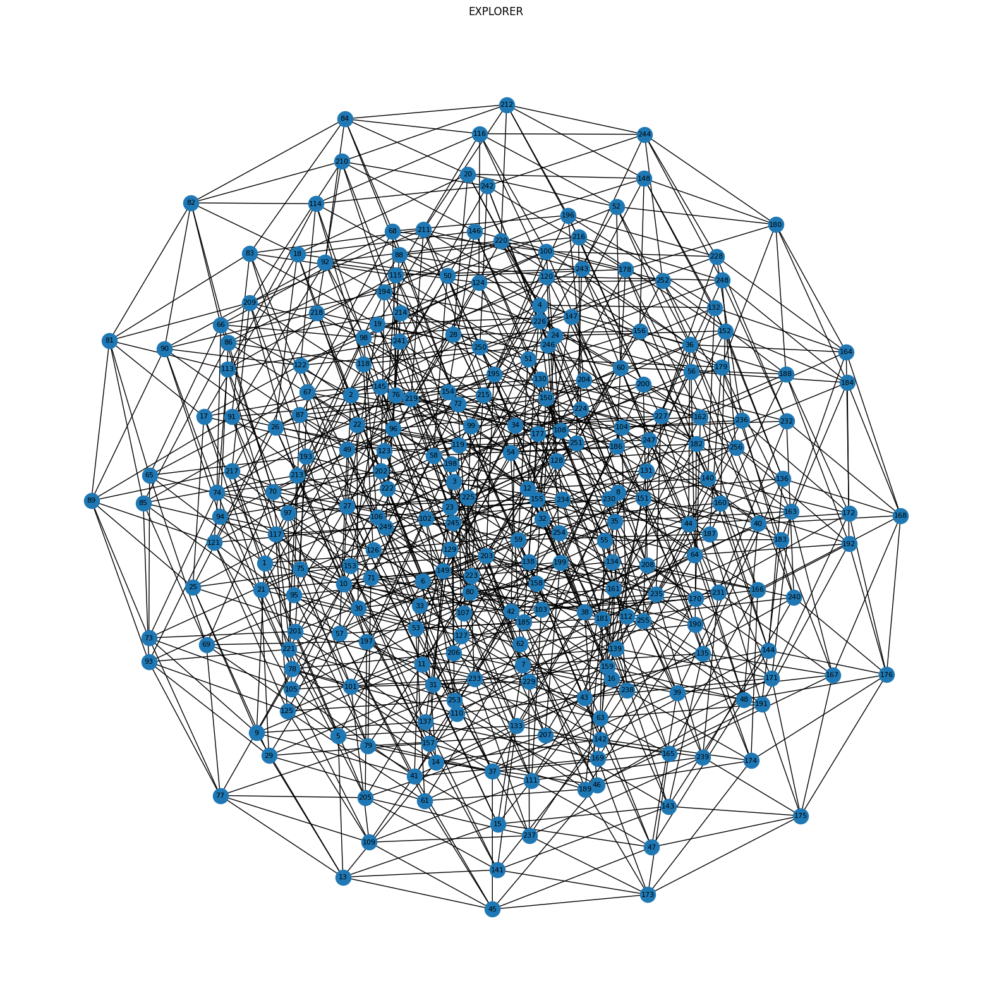

In [70]:

G_EXPLORER = nx.Graph()
G_EXPLORER.add_edges_from(edges_EXPLORER)
pos=nx.spring_layout(G_EXPLORER)
plt.figure(1,figsize=(20,20))
plt.title('EXPLORER')
nx.draw(G_EXPLORER,pos,font_size=8, with_labels=True)

In [71]:
# Defining a dictionary called NODES that record the number of node, its patterns and its energy simultaneously:

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]










NODES_LATCHER = {}
for node , (i,j) in enumerate(patterns_LATCHER):

  NODES_LATCHER[node+1] = [i,j]





NODES_EXPLORER = {}
for node , (i,j) in enumerate(patterns_EXPLORER):


  NODES_EXPLORER[node+1] = [i,j]

In [72]:
NODES

NODES_EXPLORER


NODES_LATCHER

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[0, 0, 0, 0, 0, 0, 0, 1], 0.06771348230280265],
 3: [[0, 0, 0, 0, 0, 0, 1, 0], 0.6883274610901041],
 4: [[0, 0, 0, 0, 0, 0, 1, 1], 0.45510617436153245],
 5: [[0, 0, 0, 0, 0, 1, 0, 0], 0.3180457858863154],
 6: [[0, 0, 0, 0, 0, 1, 0, 1], 0.28511364981097737],
 7: [[0, 0, 0, 0, 0, 1, 1, 0], 0.7092806340041485],
 8: [[0, 0, 0, 0, 0, 1, 1, 1], 0.3754137288974363],
 9: [[0, 0, 0, 0, 1, 0, 0, 0], 0.8593179725120514],
 10: [[0, 0, 0, 0, 1, 0, 0, 1], 1.1196852628439269],
 11: [[0, 0, 0, 0, 1, 0, 1, 0], 1.9433768123046506],
 12: [[0, 0, 0, 0, 1, 0, 1, 1], 1.902809333605152],
 13: [[0, 0, 0, 0, 1, 1, 0, 0], 1.2061505765631828],
 14: [[0, 0, 0, 0, 1, 1, 0, 1], 1.3658722485169175],
 15: [[0, 0, 0, 0, 1, 1, 1, 0], 1.993116803383511],
 16: [[0, 0, 0, 0, 1, 1, 1, 1], 1.8519037063058716],
 17: [[0, 0, 0, 1, 0, 0, 0, 0], 0.742487356310546],
 18: [[0, 0, 0, 1, 0, 0, 0, 1], 0.7989226240410967],
 19: [[0, 0, 0, 1, 0, 0, 1, 0], 1.0031025960748363],
 20: [[0, 0, 0, 

In [53]:
 [[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],


([[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],)

In [38]:
G

#### Energy VS Frequency

In [73]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.07041428051736315],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7375392906820591],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.4931357349540799],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.18698548199553833],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.10525481583704271],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.7729807400471866],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.37643223764334865],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.8083943938692303],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.2038171884660611],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.8871502367715658],
 [[0, 0, 0, 0, 1, 0, 1, 1], 1.967755195123054],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.08357652400792],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.326854371928892],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.0107883342798445],
 [[0, 0, 0, 0, 1, 1, 1, 1], 1.9392483459554741],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.719992301661915],
 [[0, 0, 0, 1, 0, 0, 0, 1], 0.7807767494104224],
 [[0, 0, 0, 1, 0, 0, 1, 0], 0.972903108468206],
 [[0, 0, 0, 1, 0, 0, 1, 1], 0.7188697199713712],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.630380

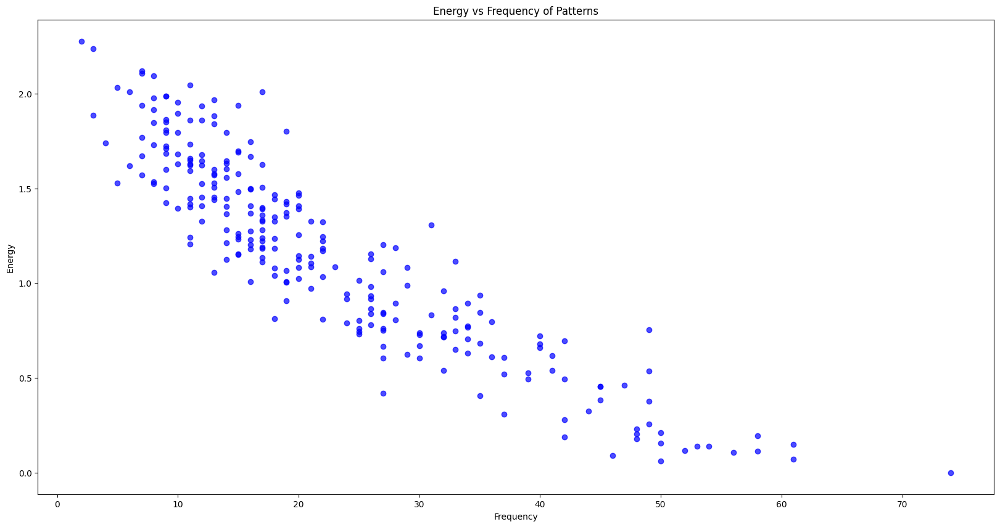

In [74]:


import numpy as np
import matplotlib.pyplot as plt
from collections import Counter



pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))

frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))

plt.scatter(frequencies, energies, color='blue', alpha=0.7)
plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')
# plt.grid(True)
plt.show()


In [ ]:
# pd.DataFrame(pattern_data)
# list(pattern_data[0][0])

In [39]:
# pattern_data
pattern_frequency

Counter({(1, 1, 1, 1, 1, 0, 0, 1): 82,
         (0, 0, 1, 0, 1, 1, 0, 0): 31,
         (0, 0, 1, 1, 1, 1, 1, 0): 23,
         (0, 1, 0, 1, 0, 1, 1, 1): 50,
         (0, 0, 0, 1, 0, 1, 0, 0): 64,
         (0, 0, 1, 0, 1, 0, 0, 0): 73,
         (0, 0, 1, 1, 0, 0, 0, 0): 32,
         (0, 1, 1, 1, 1, 0, 0, 0): 77,
         (0, 1, 1, 0, 1, 1, 0, 0): 15,
         (0, 0, 1, 1, 1, 1, 1, 1): 25,
         (0, 0, 0, 1, 0, 1, 1, 0): 51,
         (0, 1, 0, 0, 0, 0, 1, 0): 53,
         (0, 1, 0, 0, 1, 1, 1, 1): 20,
         (0, 0, 0, 0, 0, 1, 0, 1): 105,
         (0, 1, 1, 1, 1, 0, 0, 1): 76,
         (0, 1, 1, 0, 0, 0, 0, 0): 30,
         (1, 1, 1, 0, 1, 1, 0, 0): 35,
         (1, 1, 1, 1, 0, 0, 1, 1): 50,
         (0, 0, 0, 0, 0, 0, 1, 0): 83,
         (1, 0, 1, 0, 1, 0, 0, 0): 44,
         (1, 1, 1, 0, 0, 0, 1, 1): 36,
         (1, 0, 0, 0, 0, 1, 1, 0): 65,
         (1, 0, 1, 1, 0, 1, 0, 1): 42,
         (1, 0, 0, 0, 0, 0, 0, 1): 40,
         (0, 0, 0, 0, 0, 0, 1, 1): 83,
         (1, 1, 0, 0, 1,

<ipython-input-76-663a43f13ab9>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


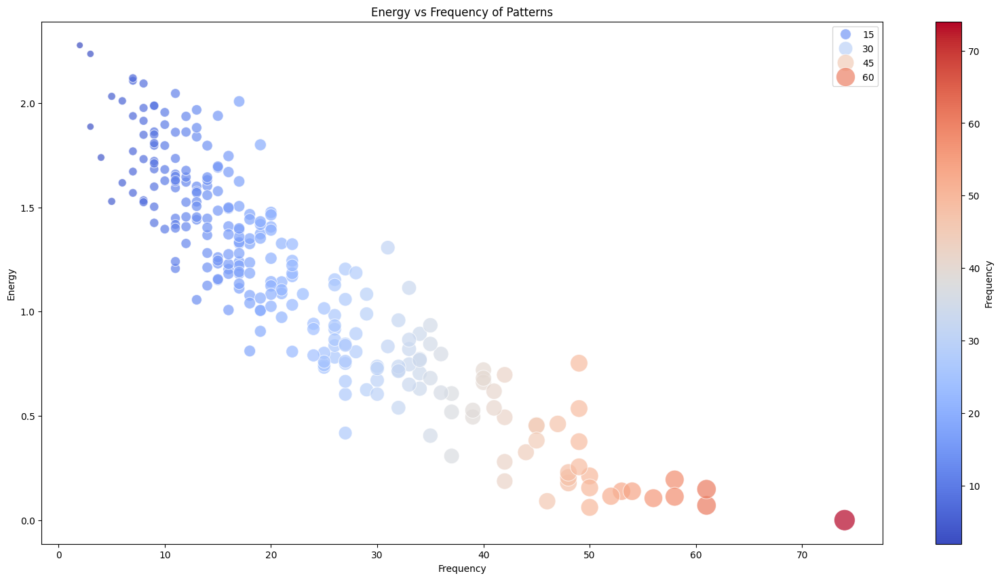

<ipython-input-76-663a43f13ab9>:104: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


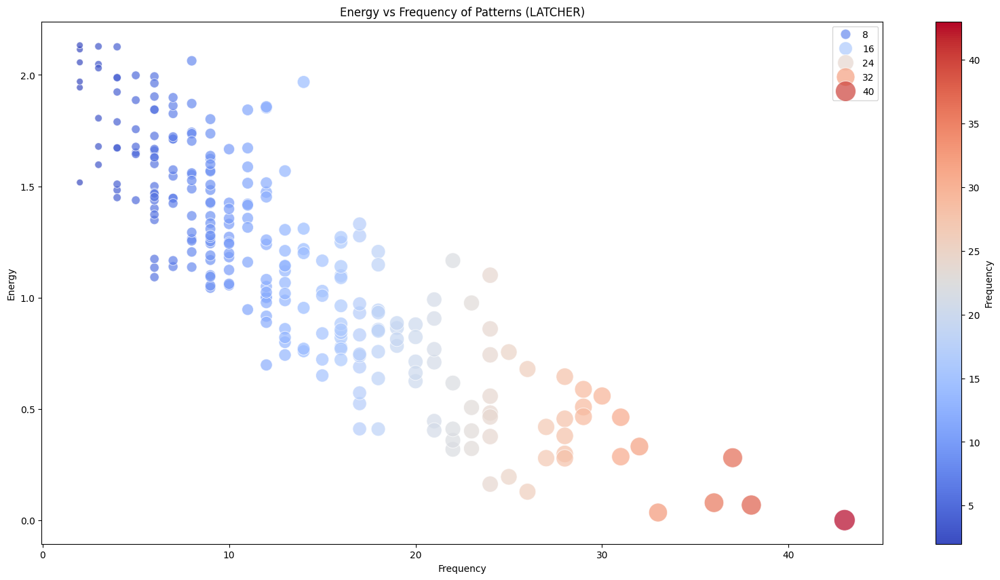

<ipython-input-76-663a43f13ab9>:168: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


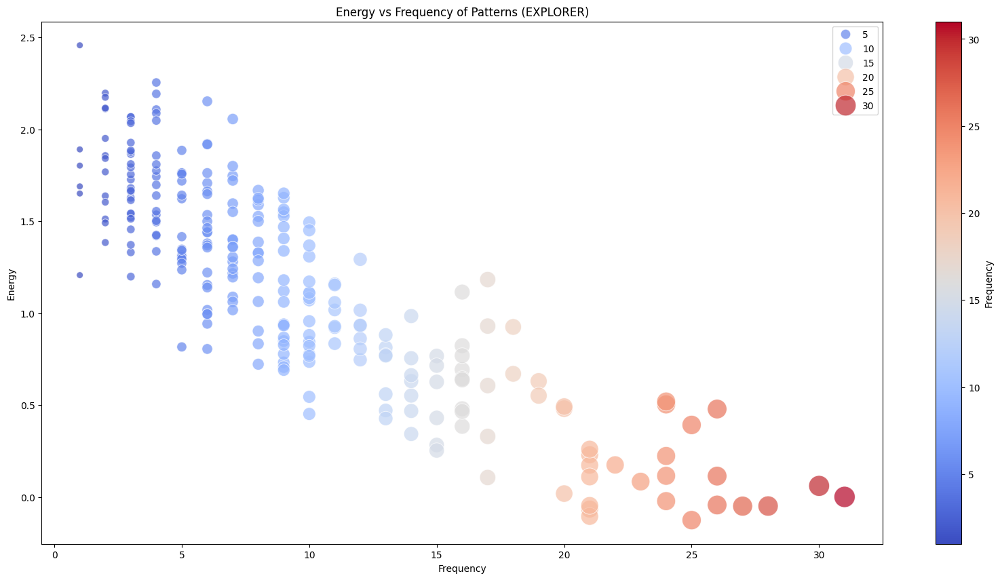

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))




frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies, y=energies,
    size=frequencies, hue=frequencies,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies), np.max(frequencies))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()
































pattern_data_LATCHER = []

for pattern_list, energy in patterns_LATCHER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_LATCHER:
        frequency = pattern_frequency_LATCHER[pattern_tuple]
        pattern_data_LATCHER.append((pattern_tuple, frequency, energy))




frequencies_LATCHER = [item[1] for item in pattern_data_LATCHER]
energies_LATCHER = [item[2] for item in pattern_data_LATCHER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_LATCHER, y=energies_LATCHER,
    size=frequencies_LATCHER, hue=frequencies_LATCHER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (LATCHER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_LATCHER), np.max(frequencies_LATCHER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()





























pattern_data_EXPLORER = []

for pattern_list, energy in patterns_EXPLORER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_EXPLORER:
        frequency = pattern_frequency_EXPLORER[pattern_tuple]
        pattern_data_EXPLORER.append((pattern_tuple, frequency, energy))




frequencies_EXPLORER = [item[1] for item in pattern_data_EXPLORER]
energies_EXPLORER = [item[2] for item in pattern_data_EXPLORER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_EXPLORER, y=energies_EXPLORER,
    size=frequencies_EXPLORER, hue=frequencies_EXPLORER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (EXPLORER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_EXPLORER), np.max(frequencies_EXPLORER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()


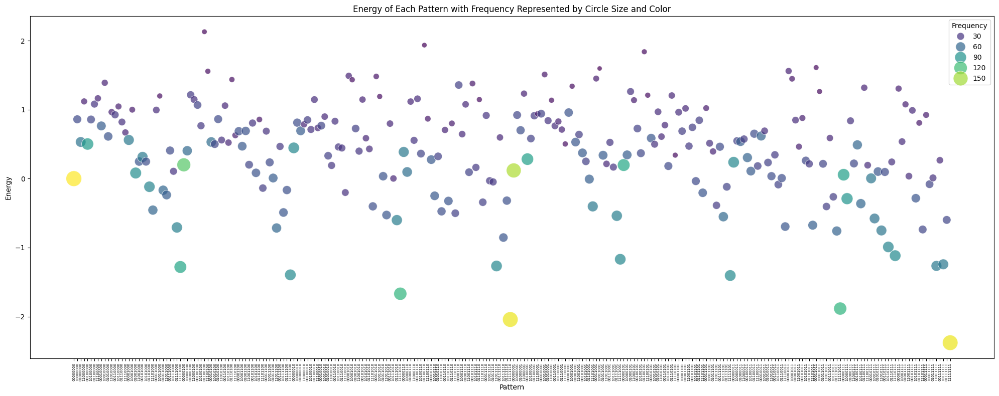

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Create a list of pattern strings for better readability in the plot
pattern_strings = [''.join(map(str, pattern[0])) for pattern in patterns]

# Extract the corresponding energies and frequencies from the original data
energies = [pattern[1] for pattern in patterns]
frequencies = [pattern_frequency.get(tuple(pattern[0]), 0) for pattern in patterns]  # Convert to tuple

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Pattern': pattern_strings,
    'Energy': energies,
    'Frequency': frequencies
})

# Plot using seaborn scatterplot
plt.figure(figsize=(20, 8))
scatter = sns.scatterplot(
    x='Pattern', y='Energy', size='Frequency', hue='Frequency',
    sizes=(50, 500), palette='viridis', data=data, alpha=0.7
)





plt.xlabel('Pattern')
plt.ylabel('Energy')
plt.title('Energy of Each Pattern with Frequency Represented by Circle Size and Color')

plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()


Text(0, 0.5, 'frequency')

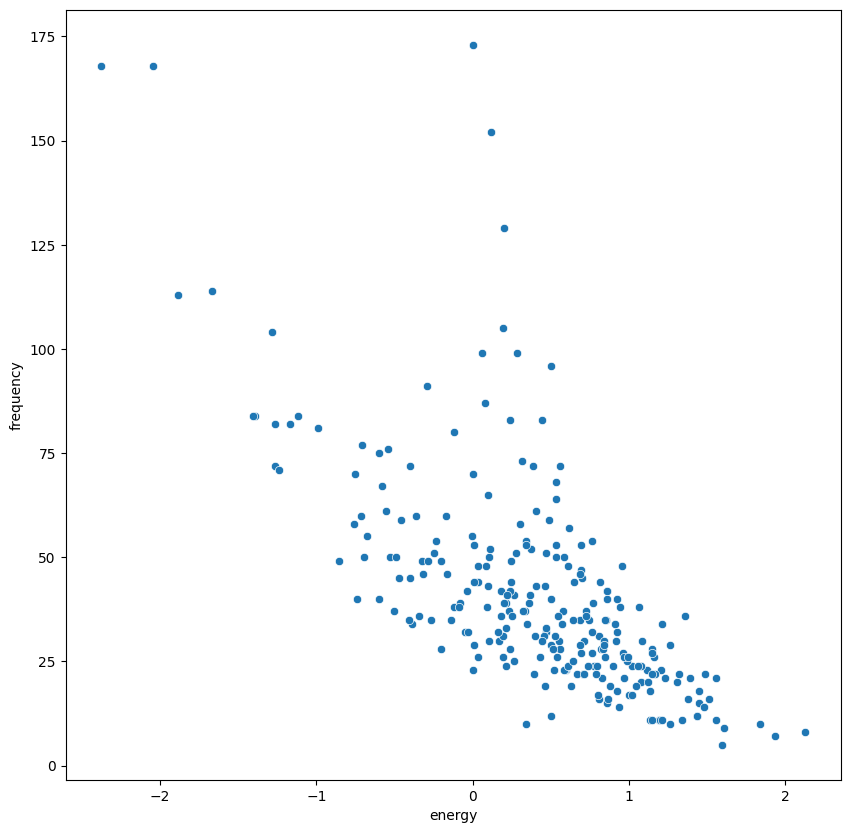

In [43]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns






ALL = {}

for k in pattern_frequency.keys():

    # print(k)
    for p in patterns:

        # print(p[0], list(k))

        if list(k) == p[0]:

            ALL[k] = [ pattern_frequency[k], p[1] ]
#     patterns
# pattern_counts


# ALL[(0, 0, 0, 0, 1, 0, 1)]

ALL









# pattern_counts

#8 networks and t0 threshold considered.







freq = []
energy = []

for k in ALL.keys():

    freq.append(ALL[k][0])
    energy.append(ALL[k][1])


len(energy)


plt.figure(figsize = (10,10))


sns.scatterplot( x = energy ,y  =freq)


plt.xlabel('energy')

plt.ylabel('frequency')






In [44]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[1, 0, 0, 0, 0, 0, 0, 0], 0.8598956651414966],
 3: [[0, 1, 0, 0, 0, 0, 0, 0], 0.5311408014988268],
 4: [[1, 1, 0, 0, 0, 0, 0, 0], 1.119121445596163],
 5: [[0, 0, 1, 0, 0, 0, 0, 0], 0.5016989285505883],
 6: [[1, 0, 1, 0, 0, 0, 0, 0], 0.8569184275013987],
 7: [[0, 1, 1, 0, 0, 0, 0, 0], 1.080232544708546],
 8: [[1, 1, 1, 0, 0, 0, 0, 0], 1.1635370226151953],
 9: [[0, 0, 0, 1, 0, 0, 0, 0], 0.7640048970350093],
 10: [[1, 0, 0, 1, 0, 0, 0, 0], 1.3889771322174005],
 11: [[0, 1, 0, 1, 0, 0, 0, 0], 0.6119314659658853],
 12: [[1, 1, 0, 1, 0, 0, 0, 0], 0.9649886801041161],
 13: [[0, 0, 1, 1, 0, 0, 0, 0], 0.9253098031751387],
 14: [[1, 0, 1, 1, 0, 0, 0, 0], 1.0456058721668438],
 15: [[0, 1, 1, 1, 0, 0, 0, 0], 0.8206291867651455],
 16: [[1, 1, 1, 1, 0, 0, 0, 0], 0.6690102347126898],
 17: [[0, 0, 0, 0, 1, 0, 0, 0], 0.5605379662685026],
 18: [[1, 0, 0, 0, 1, 0, 0, 0], 0.998929581660368],
 19: [[0, 1, 0, 0, 1, 0, 0, 0], 0.0814704288008481],
 20: [[1, 1, 0, 0, 

# Local Minima Identification

I am a local minimum. --  1 8 -0.0 [[0.8598956651414966, 0.5311408014988268, 0.5016989285505883, 0.7640048970350093, 0.5605379662685026, 0.20006895607054767, 0.44567136470738616, 0.11863438931331897]] 1 8
I am a local minimum. --  256 8 -2.378175311825072 [[-2.0416822391847025, -1.4043760103750857, -1.8831044764394647, -1.1164950509212854, -0.7370927029893282, -1.2646104653823316, -1.2417498312322812, -0.598288125840273]] 256 8

 IN LATCHER
I am a local minimum. --  1 8 -0.0 [[1.6942975223348624, 1.6203428322296052, 1.6072362934628546, 1.6750971989980339, 1.6545268461890719, 1.4341682199846237, 1.562418832907068, 1.3663446432323254]] 1 8
I am a local minimum. --  256 8 -4.712336717174271 [[-2.555684691023398, -2.0061313265853116, -2.4516608568405758, -1.8143680611218649, -1.5846755993487367, -1.829395536889404, -1.8863279827067903, -1.5313438591910966]] 256 8

 IN EXPLORER
I am a local minimum. --  1 8 -0.0 [[1.9690186071791869, 1.8622540859047614, 1.792496374667303, 1.9312813296670566

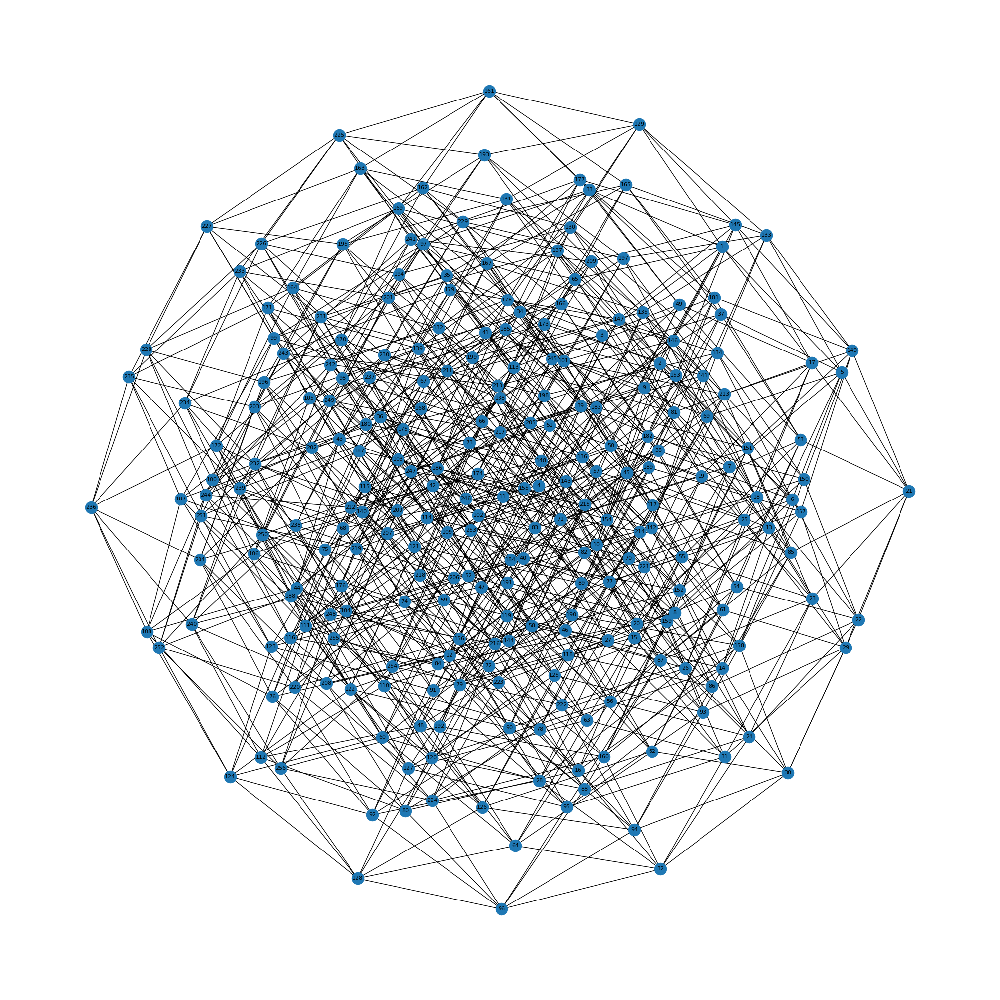

In [45]:


edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))







#  G is the graph object of the

G = nx.Graph()
G.add_edges_from(edges)
pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))
nx.draw(G,pos,font_size=8, with_labels=True)





# keys = [n for n in G.nodes()]
# values = patterns
# NODES = {k: v for k, v in zip(keys, values)}



######## each node key is equivalent to a special pattern and its value is the pattern and its energy , for example ; as the patterns vector is a numpy array and starts from 0,we have this : NODES[46] == patterns[45])

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]




NODE2 = NODES.copy()

NODES




# tHE local minima will be recorded in LM list (definition: the minimum energy among the neighbors) :
LM = []





for node in NODES.keys():

  # # defining the neighbors of node:

  ne =  list(G.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM.append(node)







len(LM)



























print('\n IN LATCHER')


# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_LATCHER = []

for node in NODES_LATCHER.keys():

  # # defining the neighbors of node:

  ne =  list(G_LATCHER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_LATCHER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_LATCHER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_LATCHER.append(node)































print('\n IN EXPLORER')
# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_EXPLORER = []

for node in NODES_EXPLORER.keys():

  # # defining the neighbors of node:

  ne =  list(G_EXPLORER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_EXPLORER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_EXPLORER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_EXPLORER.append(node)













In [46]:
LM_LATCHER

LM_EXPLORER


LM

[1, 256]

In [47]:
LM_EXPLORER

[1, 256]

In [48]:

LM_LATCHER

[1, 256]

In [49]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[0, 0, 0, 0, 0, 0, 0, 1], 0.22795158396997853],
 3: [[0, 0, 0, 0, 0, 0, 1, 0], 0.7185070470610802],
 4: [[0, 0, 0, 0, 0, 0, 1, 1], 0.6197629986965643],
 5: [[0, 0, 0, 0, 0, 1, 0, 0], 0.35010343410582134],
 6: [[0, 0, 0, 0, 0, 1, 0, 1], 0.456232395211394],
 7: [[0, 0, 0, 0, 0, 1, 1, 0], 0.8093243470777536],
 8: [[0, 0, 0, 0, 0, 1, 1, 1], 0.5887576758488318],
 9: [[0, 0, 0, 0, 1, 0, 0, 0], 0.8908069494027546],
 10: [[0, 0, 0, 0, 1, 0, 0, 1], 1.3973058832737837],
 11: [[0, 0, 0, 0, 1, 0, 1, 0], 2.092192971211089],
 12: [[0, 0, 0, 0, 1, 0, 1, 1], 2.271996272747624],
 13: [[0, 0, 0, 0, 1, 1, 0, 0], 1.1674305243063325],
 14: [[0, 0, 0, 0, 1, 1, 0, 1], 1.552106835312956],
 15: [[0, 0, 0, 0, 1, 1, 1, 0], 2.109530412025519],
 16: [[0, 0, 0, 0, 1, 1, 1, 1], 2.167511090697648],
 17: [[0, 0, 0, 1, 0, 0, 0, 0], 1.1960073455525129],
 18: [[0, 0, 0, 1, 0, 0, 0, 1], 1.4824444112250985],
 19: [[0, 0, 0, 1, 0, 0, 1, 0], 1.4724997493174596],
 20: [[0, 0, 0, 1, 0

## Domain size of local minma

In [49]:



#NE is the neighbor members


def search_minimum_energy(NE, threshold):

  e = []

  for l in range(len(NE)):

      e.append(NE[l][1])

  m_ind = e.index(min(e))

  if min(e) < threshold:

    return(NE[m_ind][0])


  # ind = next(idx for idx, val in enumerate(e) if val <= threshold)

  return([])


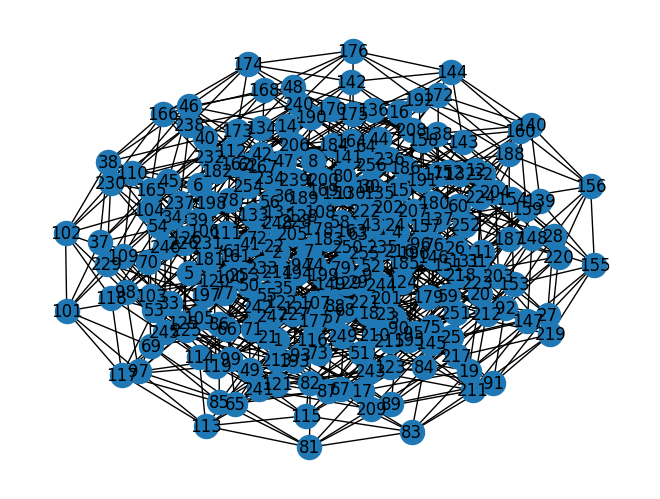

In [50]:
# network construction:

# def edge_list(patterns):

edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))











G = nx.Graph()

G.add_edges_from(edges)

nx.draw(G, with_labels=True)
plt.show()








def basins(G,NODES,ROI):

                label = {}


                for node in range(1,1+ (2**ROI)):



                        ## THE THRESHOLD FOR ENERGY, NOW IS CONSIDERED AS THE ENERGY OF NODE_T

                          node_T = node
                          N = list(G.neighbors(node))
                          # print(N)




                          E_node = NODES[node][1]

                          energies_neighbors = [[n, NODES[n][1]] for n in N]


                          # print(energies_neighbors, E_node)
                          # print(node, 'its node')



                ## T would provide the nodes whose energies are less than current node energy, if there is no node with this condition, then it will be empty:

                          T = search_minimum_energy(energies_neighbors, E_node)




                          print('node, node_T, n, T, energies_neighbors',node, node_T, N, T, energies_neighbors)

                          print(energies_neighbors, 'energies_neighbors')





                          track =[]
                          track.append(node_T)


                          if T != []:
                              N = list(G.neighbors(T))

                              # print(T)


                              # T = node that has energy < E_node


                              while T != []:



                                  track.append(T)


                                  node_T = T
                                  N = list(G.neighbors(node_T))


                                    # print(N)


                                  E_T = NODES[node_T][1]


                                  energies_neighbors = [[n, NODES[n][1]] for n in N]

                                  T = search_minimum_energy(energies_neighbors, E_T)

                                  track.append(T)

                          print(node, track)
                          label[node] = node_T



                return(label)


In [51]:
label = basins(G,NODES,ROI)


label_LATCHER = basins(G_LATCHER , NODES_LATCHER,ROI)


label_EXPLORER = basins(G_EXPLORER , NODES_EXPLORER,ROI)

node, node_T, n, T, energies_neighbors 1 1 [2, 3, 5, 9, 17, 33, 65, 129] [] [[2, 0.8598956651414966], [3, 0.5311408014988268], [5, 0.5016989285505883], [9, 0.7640048970350093], [17, 0.5605379662685026], [33, 0.20006895607054767], [65, 0.44567136470738616], [129, 0.11863438931331897]]
[[2, 0.8598956651414966], [3, 0.5311408014988268], [5, 0.5016989285505883], [9, 0.7640048970350093], [17, 0.5605379662685026], [33, 0.20006895607054767], [65, 0.44567136470738616], [129, 0.11863438931331897]] energies_neighbors
1 [1]
node, node_T, n, T, energies_neighbors 2 2 [1, 4, 6, 10, 18, 34, 66, 130] 1 [[1, -0.0], [4, 1.119121445596163], [6, 0.8569184275013987], [10, 1.3889771322174005], [18, 0.998929581660368], [34, 0.4041290301907271], [66, 0.8115941670251804], [130, 0.9215743241171238]]
[[1, -0.0], [4, 1.119121445596163], [6, 0.8569184275013987], [10, 1.3889771322174005], [18, 0.998929581660368], [34, 0.4041290301907271], [66, 0.8115941670251804], [130, 0.9215743241171238]] energies_neighbors
2 [2

In [52]:
set(label.values())

{1, 256}

In [53]:
from collections import Counter

BASIN_SIZE = Counter(list(label.values())) #Counter(L)

for key in BASIN_SIZE.keys():
  # if c[key] >= 1 :
    print(key, 'its basin size is :', BASIN_SIZE[key] , 'its pattern and energy are :', NODES[key] )












BASIN_SIZE_LATCHER = Counter(list(label_LATCHER.values())) #Counter(L)

for key in BASIN_SIZE_LATCHER.keys():
  # if c[key] >= 1 :
    print('LATCHERS',key, 'its basin size is :', BASIN_SIZE_LATCHER[key] , 'its pattern and energy are :', NODES_LATCHER[key] )










BASIN_SIZE_EXPLORER = Counter(list(label_EXPLORER.values())) #Counter(L)

for key in BASIN_SIZE_EXPLORER.keys():
  # if c[key] >= 1 :
    print('EXPLORERS: ', key, 'its basin size is :', BASIN_SIZE_EXPLORER[key] , 'its pattern and energy are :', NODES_EXPLORER[key] )

1 its basin size is : 20 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
256 its basin size is : 236 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -2.378175311825072]
LATCHERS 1 its basin size is : 49 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
LATCHERS 256 its basin size is : 207 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -4.712336717174271]
EXPLORERS:  1 its basin size is : 43 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
EXPLORERS:  256 its basin size is : 213 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -5.291397342734571]


In [65]:
LM

[1, 73, 184, 256]

## Major and Minor local minima

In [220]:
major_local = [136,121]
minor_local = [256,1]






major_local_LATCHERS = [1]
minor_local_LATCHERS = [256]





major_local_EXPLORERS = [1]
minor_local_EXPLORERS = [256]











In [221]:
NODES[136]




[[1, 0, 0, 0, 0, 1, 1, 1], 0.09533604180965938]

In [222]:
NODES_LATCHER[136]

[[1, 0, 0, 0, 0, 1, 1, 1], 4.309305712558144]

In [223]:
print(H_rand, '\n',H_explorers,'\n' ,H_latcher)

[-0.41168306 -0.46901129 -0.40816571 -0.44774074 -0.50731941 -0.09319553
 -0.45965166 -0.01550056] 
 [-1.85672049 -1.98132779 -1.86103595 -1.85321432 -1.94104453 -1.71994503
 -1.87674034 -1.72113677] 
 [-1.51709257 -1.57132284 -1.52188322 -1.54966996 -1.62658186 -1.44042301
 -1.53340454 -1.34634719]


In [224]:
print(J_rand, '\n ----------',J_explorers,'\n ---------' ,J_latcher)

[[-0.51168306  0.04695579  0.20297008 -0.09862751  0.24672563  0.65926982
   0.31942403 -0.0252437 ]
 [ 0.04695579 -0.56901129  0.42988242  0.32806937  1.25345442 -0.50411135
   0.16591447 -0.32901518]
 [ 0.20297008  0.42988242 -0.50816571 -0.06585606  0.32745677 -0.26412091
   0.37315633  0.32650216]
 [-0.09862751  0.32806937 -0.06585606 -0.54774074  0.52239894  0.27731336
   0.48518888  0.0101708 ]
 [ 0.24672563  1.25345442  0.32745677  0.52239894 -0.60731941 -0.08730189
  -0.3412203  -0.32434868]
 [ 0.65926982 -0.50411135 -0.26412091  0.27731336 -0.08730189 -0.19319553
   0.15220607  0.15344013]
 [ 0.31942403  0.16591447  0.37315633  0.48518888 -0.3412203   0.15220607
  -0.55965166  0.31561383]
 [-0.0252437  -0.32901518  0.32650216  0.0101708  -0.32434868  0.15344013
   0.31561383 -0.11550056]] 
 ---------- [[-1.95672049  0.5152674   0.70526846  0.02843262  0.66003302  1.60014275
   1.03820135  0.56588368]
 [ 0.5152674  -2.08132779  1.33107126  0.7334552   2.31274237 -0.15687641
   

In [73]:
generate_combinations(N, H_rand, J_rand)





[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.22795158396997853],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7185070470610802],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.6197629986965643],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.35010343410582134],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.456232395211394],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.8093243470777536],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.5887576758488318],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.8908069494027546],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.3973058832737837],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.092192971211089],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.271996272747624],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.1674305243063325],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.552106835312956],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.109530412025519],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.167511090697648],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.1960073455525129],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.4824444112250985],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.4724997493174596],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.4322411826555506],
 [[0, 0, 0, 1, 0, 1, 0, 0], 1.11318521

In [66]:
generate_combinations(N, H_latcher, J_latcher)

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 2.099516964848487],
 [[0, 0, 0, 0, 0, 0, 1, 0], 2.393628249360601],
 [[0, 0, 0, 0, 0, 0, 1, 1], 3.5351861619835763],
 [[0, 0, 0, 0, 0, 1, 0, 0], 2.2012523299769344],
 [[0, 0, 0, 0, 0, 1, 0, 1], 3.6317544113868148],
 [[0, 0, 0, 0, 0, 1, 1, 0], 3.691320601204017],
 [[0, 0, 0, 0, 0, 1, 1, 1], 4.163863630388384],
 [[0, 0, 0, 0, 1, 0, 0, 0], 2.5317902692836074],
 [[0, 0, 0, 0, 1, 0, 0, 1], 4.559407349423623],
 [[0, 0, 0, 0, 1, 0, 1, 0], 5.195152895970461],
 [[0, 0, 0, 0, 1, 0, 1, 1], 6.264810923884964],
 [[0, 0, 0, 0, 1, 1, 0, 0], 4.402545868003446],
 [[0, 0, 0, 0, 1, 1, 0, 1], 5.761148064704855],
 [[0, 0, 0, 0, 1, 1, 1, 0], 6.16234851655678],
 [[0, 0, 0, 0, 1, 1, 1, 1], 6.562991661032677],
 [[0, 0, 0, 1, 0, 0, 0, 0], 2.562645798497049],
 [[0, 0, 0, 1, 0, 0, 0, 1], 4.4622589540865505],
 [[0, 0, 0, 1, 0, 0, 1, 0], 4.295571787644262],
 [[0, 0, 0, 1, 0, 0, 1, 1], 5.237225891008251],
 [[0, 0, 0, 1, 0, 1, 0, 0], 3.5746343201187805],


In [74]:

generate_combinations(N, H_explorers, J_explorers)

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 2.5622681042788558],
 [[0, 0, 0, 0, 0, 0, 1, 0], 2.740283796313755],
 [[0, 0, 0, 0, 0, 0, 1, 1], 4.3445211204028755],
 [[0, 0, 0, 0, 0, 1, 0, 0], 2.665782714829611],
 [[0, 0, 0, 0, 0, 1, 0, 1], 4.147458858794035],
 [[0, 0, 0, 0, 0, 1, 1, 0], 4.552723723277545],
 [[0, 0, 0, 0, 0, 1, 1, 1], 5.0763690870522336],
 [[0, 0, 0, 0, 1, 0, 0, 0], 2.8785678025053065],
 [[0, 0, 0, 0, 1, 0, 0, 1], 5.441406680876575],
 [[0, 0, 0, 0, 1, 0, 1, 0], 6.32865575664168],
 [[0, 0, 0, 0, 1, 0, 1, 1], 7.933463854823215],
 [[0, 0, 0, 0, 1, 1, 0, 0], 4.4498461193917205],
 [[0, 0, 0, 0, 1, 1, 0, 1], 5.932093037448557],
 [[0, 0, 0, 0, 1, 1, 1, 0], 7.046591285662273],
 [[0, 0, 0, 0, 1, 1, 1, 1], 7.5708074235293745],
 [[0, 0, 0, 1, 0, 0, 0, 0], 2.9469219945005847],
 [[0, 0, 0, 1, 0, 0, 0, 1], 5.202534313120719],
 [[0, 0, 0, 1, 0, 0, 1, 0], 4.494359181843856],
 [[0, 0, 0, 1, 0, 0, 1, 1], 5.791940720274255],
 [[0, 0, 0, 1, 0, 1, 0, 0], 5.072107008187192],

In [228]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.07325083527974763],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.739477496101865],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.4971144985683806],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.1897932976386026],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.10960400078101301],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.7770647257956231],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.3812615961248017],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.8109791125712188],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.2085786237599634],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.8916769055108986],
 [[0, 0, 0, 0, 1, 0, 1, 1], 1.9736625838864112],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.0880743001008937],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.332233679152301],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.016566025095729],
 [[0, 0, 0, 0, 1, 1, 1, 1], 1.9451115713339044],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.7216111155526096],
 [[0, 0, 0, 1, 0, 0, 0, 1], 0.7846911542517876],
 [[0, 0, 0, 1, 0, 0, 1, 0], 0.9758997287931418],
 [[0, 0, 0, 1, 0, 0, 1, 1], 0.7233659346790878],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.63409

In [229]:

patterns_LATCHER

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 2.069520788342926],
 [[0, 0, 0, 0, 0, 0, 1, 0], 2.350106811870951],
 [[0, 0, 0, 0, 0, 0, 1, 1], 3.569587145581959],
 [[0, 0, 0, 0, 0, 1, 0, 0], 2.210634514282273],
 [[0, 0, 0, 0, 0, 1, 0, 1], 3.559318644755128],
 [[0, 0, 0, 0, 0, 1, 1, 0], 3.758666584376202],
 [[0, 0, 0, 0, 0, 1, 1, 1], 4.25731026021714],
 [[0, 0, 0, 0, 1, 0, 0, 0], 2.4898727908988185],
 [[0, 0, 0, 0, 1, 0, 0, 1], 4.383626318272709],
 [[0, 0, 0, 0, 1, 0, 1, 0], 5.1349765932595615],
 [[0, 0, 0, 0, 1, 0, 1, 1], 6.178689666001534],
 [[0, 0, 0, 0, 1, 1, 0, 0], 4.3204188793900995],
 [[0, 0, 0, 0, 1, 1, 0, 1], 5.493335748893919],
 [[0, 0, 0, 0, 1, 1, 1, 0], 6.16344793997382],
 [[0, 0, 0, 0, 1, 1, 1, 1], 6.486324354845723],
 [[0, 0, 0, 1, 0, 0, 0, 0], 2.374504945724971],
 [[0, 0, 0, 1, 0, 0, 0, 1], 3.988066505438803],
 [[0, 0, 0, 1, 0, 0, 1, 0], 3.849008078464599],
 [[0, 0, 0, 1, 0, 0, 1, 1], 4.612529183546513],
 [[0, 0, 0, 1, 0, 1, 0, 0], 3.8031494850556675],
 [[

# Random walk simulation

In [230]:
LM

[1, 121, 136, 256]

In [ ]:
# Based on the paper, we have to simulate the random walk for each group initiallized with a random step for 10^5 times.
# What I grassped is that, we should

In [61]:

def Random_walk(G, NODES):

          # initial state :
          init_state = random.choice(list(G.nodes()))
          current_state = init_state
          TIME = 10**5



          trajectory = []

          for time in range(TIME):



              trajectory.append(current_state)


              r = random.uniform(0, 1)



              e_current = NODES[current_state][1]

              neighbors = list(G.neighbors(current_state))




              p = np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in neighbors ] )


              normalterm = np.sum(np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in list(G.neighbors(current_state))] ))


              p = p/normalterm

              # print(p)


              new_state = np.random.choice(list(G.neighbors(current_state)), p = p)


              P = p[np.argmax(p)]



              # BASED on MCMC method, we accept just the new state with probability of p:



              if r <= P:

                current_state = new_state





          #### now remove the first 100 step of the trajectory vector since they are trying to keep the system in a good manner :


          trajectory = trajectory[100:]

          return(trajectory)




In [56]:
LM

[1, 73, 184, 256]

In [59]:


def transition_frequency(G,NODES, LM):

            from collections import Counter, defaultdict

            trajectory = Random_walk(G,NODES)


            # List of special states to track
            special_states = LM

            # Compute frequency of major local minima
            state_counter = Counter([x for x in trajectory if x in special_states])

            # Track transitions before and after each special state
            transitions = defaultdict(list)

            for i, state in enumerate(trajectory):
                if state in special_states:
                    # Capture the before and after states if they exist
                    before = trajectory[i-1] if i > 0 else None
                    after = trajectory[i+1] if i < len(trajectory) - 1 else None
                    transitions[state].append((before, after))


            print("Frequency of special states:", state_counter)
            print("Transitions around special states:")
            for state, trans in transitions.items():
                print(f"State {state}: {trans}")








            sorted_frequent_transitions = {}

            for state, trans_list in transitions.items():
                # Count the frequency of each (before, after) tuple
                transition_counter = Counter(trans_list)
                # Get all transitions sorted by frequency
                sorted_transitions = transition_counter.most_common()
                sorted_frequent_transitions[state] = sorted_transitions

            print("Sorted frequency of transitions for each special state:")
            for state, sorted_trans in sorted_frequent_transitions.items():
                print(f"\nState {state}:")
                for trans_tuple, frequency in sorted_trans:
                    print(f"  Transition {trans_tuple}: occurred {frequency} times")





            return(sorted_frequent_transitions, trajectory)



In [62]:
sorted_frequent_transitions, trajectory = transition_frequency(G, NODES, LM)

Frequency of special states: Counter({256: 898, 184: 778, 1: 740, 73: 611})
Transitions around special states:
State 256: [(255, 256), (256, 256), (256, 256), (256, 255), (254, 256), (256, 256), (256, 254), (192, 256), (256, 256), (256, 224), (255, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 255), (128, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 252), (252, 255), (255, 256), (256, 256), (256, 248), (255, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 240), (128, 256), (256, 256), (256, 256), (256, 256), (256, 252), (192, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 252), (252, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 224), (224, 240), (224, 255), (255, 256), (256, 256), (

In [63]:
sorted_frequent_transitions_LATCHER, trajectory_LATCHER = transition_frequency(G_LATCHER, NODES_LATCHER, LM_LATCHER)




Frequency of special states: Counter({1: 7740, 256: 1764})
Transitions around special states:
State 1: [(9, 5), (5, 65), (17, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 5), (5, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 17), (17, 1), (1, 1), (1, 33), (33, 2), (65, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 17), (17, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 2), (129, 1), (1, 17), (17, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 17), (5, 1), (1, 1), (1, 2), (5, 1), (1, 33), (129, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 9), (65, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 2), (2, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 17), (3, 1), (1, 1), (1, 1), (1, 1), (1, 3), (3, 1), (1, 9), (9, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 65), (9, 

In [64]:
sorted_frequent_transitions_EXPLORER, trajectory_EXPLORER = transition_frequency(G_EXPLORER, NODES_EXPLORER, LM_EXPLORER)


Frequency of special states: Counter({1: 14146, 256: 2146})
Transitions around special states:
State 1: [(33, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 65), (9, 17), (33, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 3), (3, 1), (1, 1), (1, 1), (1, 5), (9, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 129), (129, 1), (1, 1), (1, 1), (1, 129), (129, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 65), (65, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 2), (2, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 33), (9, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 9), (129, 5), (5, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 33), (129, 1), (1, 2), (2, 1), (1, 1), (1, 2), (2, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 9), (9, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1,

# Disconnectivity graph